Loading the Data

In [ ]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.

import kagglehub
kagglehub.login()

Kaggle credentials set.
Kaggle credentials successfully validated.


In [ ]:
!pip install geopandas contextily

import geopandas as gpd
import contextily as cx
from shapely.geometry import Point
!pip install folium

import folium
from folium.plugins import MarkerCluster
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pyarrow
import matplotlib.pyplot as plt
import seaborn as sns

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 83.0 MB/s eta 0:00:00


In [ ]:
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory


for dirname, _, filenames in os.walk('/content/mv_surface_temperatures_wide.parquet'):
     for filename in filenames:
         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

df = pd.read_parquet('/content/mv_surface_temperatures_wide.parquet')
#df = pd.read_parquet('hack-the-globe/mv_surface_temperatures_wide.parquet')
display(df)


,st_id,site_id,measured_at,protocol_id,userid,surface_condition,organizationid,usertype,submission_id,st_updated_at,...,site_true_latitude,site_true_longitude,site_true_elevation,site_true_point,site_photo_measured_at,site_photo_primary_thumb_url,site_photo_primary_photo_url,site_photo_photo_data,developer_key_name,developer_key_is_citizen_science
0,1957,10652,2008-01-21 11:00:00,8,-1,None,166361,-1,<NA>,2012-07-03 13:56:42.722429,...,NaN,NaN,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False
1,1957,10652,2008-01-21 11:00:00,8,-1,None,166361,-1,<NA>,2012-07-03 13:56:42.722429,...,NaN,NaN,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False
2,1957,10652,2008-01-21 11:00:00,8,-1,None,166361,-1,<NA>,2012-07-03 13:56:42.722429,...,NaN,NaN,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False
3,1958,10652,2008-01-22 11:00:00,8,-1,None,166361,-1,<NA>,2012-07-03 13:56:42.743904,...,NaN,NaN,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False
4,1958,10652,2008-01-22 11:00:00,8,-1,None,166361,-1,<NA>,2012-07-03 13:56:42.743904,...,NaN,NaN,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
716026,166969,318180,2025-03-27 17:40:00,8,107437128,dry,107437161,11,59928075,2025-03-27 18:13:17.113169,...,NaN,NaN,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False
716027,166969,318180,2025-03-27 17:40:00,8,107437128,dry,107437161,11,59928075,2025-03-27 18:13:17.113169,...,NaN,NaN,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False
716028,166969,318180,2025-03-27 17:40:00,8,107437128,dry,107437161,11,59928075,2025-03-27 18:13:17.113169,...,NaN,NaN,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False
716029,166969,318180,2025-03-27 17:40:00,8,107437128,dry,107437161,11,59928075,2025-03-27 18:13:17.113169,...,NaN,NaN,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False


**Phase 1: Foundational Exploration and Preprocessing**

Initial Data Characterization

In [ ]:
!pip install ydata-profiling


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 34.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=b9b96d0e70819bb3084771604b3e9740e64b0559ffd740edc0c4774712d92dee
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.8/70.8 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.3/46.3 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:

from ydata_profiling import ProfileReport

# Load your DataFrame


# Generate the profile
profile = ProfileReport(df, title="YData Profile Report", explorative=True)

# Show in notebook (Colab)
profile.to_notebook_iframe()

# Optional: Save as HTML
profile.to_file("ydata_profile_local.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


  8%|▊         | 5/64 [00:03<00:47,  1.25it/s]


KeyboardInterrupt: 

In [ ]:
# Memory usage and types
df.info(memory_usage='deep')

# Summary stats for numeric columns
df.describe()

# If dataset is large:
import dask.dataframe as dd
ddf = dd.from_pandas(df, npartitions=4)
ddf.describe().compute()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 716031 entries, 0 to 716030
Data columns (total 64 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   st_id                             716031 non-null  Int64         
 1   site_id                           716031 non-null  Int64         
 2   measured_at                       716031 non-null  datetime64[ns]
 3   protocol_id                       716031 non-null  Int64         
 4   userid                            716031 non-null  Int64         
 5   surface_condition                 584465 non-null  object        
 6   organizationid                    716031 non-null  int64         
 7   usertype                          716031 non-null  Int64         
 8   submission_id                     90065 non-null   Int64         
 9   st_updated_at                     716031 non-null  object        
 10  st_created_at                   

TypeError: Cannot interpret 'Int64Dtype()' as a data type

Exploratory Data Analysis

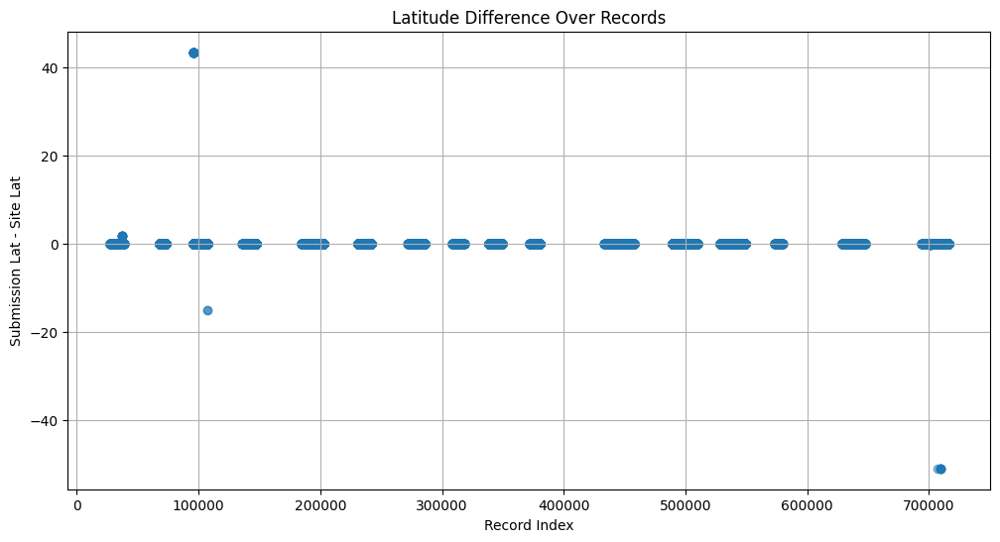

,st_id,site_id,measured_at,protocol_id,userid,surface_condition,organizationid,usertype,submission_id,st_updated_at,...,site_true_elevation,site_true_point,site_photo_measured_at,site_photo_primary_thumb_url,site_photo_primary_photo_url,site_photo_photo_data,developer_key_name,developer_key_is_citizen_science,lat_diff,is_outlier
96136,100260,241787,2021-10-06 16:05:00,8,2521381,dry,394556,11,32523980,2021-10-06 16:11:14.016379,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True
96137,100260,241787,2021-10-06 16:05:00,8,2521381,dry,394556,11,32523980,2021-10-06 16:11:14.016379,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True
96138,100260,241787,2021-10-06 16:05:00,8,2521381,dry,394556,11,32523980,2021-10-06 16:11:14.016379,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True
96139,100260,241787,2021-10-06 16:05:00,8,2521381,dry,394556,11,32523980,2021-10-06 16:11:14.016379,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True
96140,100260,241787,2021-10-06 16:05:00,8,2521381,dry,394556,11,32523980,2021-10-06 16:11:14.016379,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True
96141,100260,241787,2021-10-06 16:05:00,8,2521381,dry,394556,11,32523980,2021-10-06 16:11:14.016379,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True
96142,100260,241787,2021-10-06 16:05:00,8,2521381,dry,394556,11,32523980,2021-10-06 16:11:14.016379,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True
96143,100260,241787,2021-10-06 16:05:00,8,2521381,dry,394556,11,32523980,2021-10-06 16:11:14.016379,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True
96144,100260,241787,2021-10-06 16:05:00,8,2521381,dry,394556,11,32523980,2021-10-06 16:11:14.016379,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True
96171,100318,241787,2021-10-07 16:32:00,8,2521381,wet,394556,21,32558748,2021-10-07 16:41:03.950463,...,NaN,None,NaT,<NA>,<NA>,<NA>,GLOBE Data Entry Web Forms,False,43.342788,True


In [ ]:
df['lat_diff'] = df['submission_latitude'] - df['site_latitude']

plt.figure(figsize=(12, 6))
plt.scatter(df.index, df['lat_diff'], alpha=0.5)
plt.title("Latitude Difference Over Records")
plt.xlabel("Record Index")
plt.ylabel("Submission Lat - Site Lat")
plt.grid(True)
plt.show()

df['is_outlier'] = abs(df['lat_diff']) > 10
display(df[df['is_outlier'] == True])

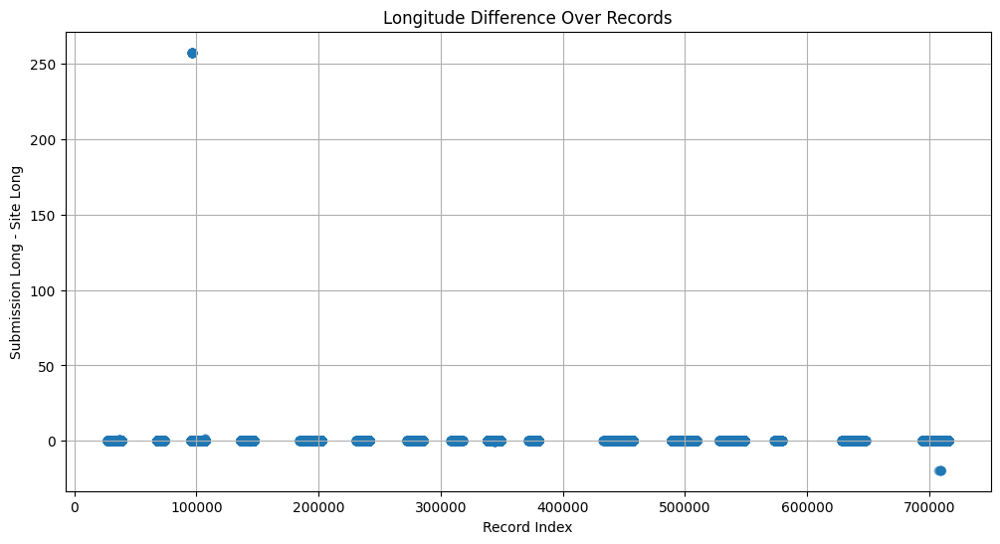

In [ ]:
df['long_diff'] = df['submission_longitude'] - df['site_longitude']

plt.figure(figsize=(12, 6))
plt.scatter(df.index, df['long_diff'], alpha=0.5)
plt.title("Longitude Difference Over Records")
plt.xlabel("Record Index")
plt.ylabel("Submission Long - Site Long")
plt.grid(True)
plt.show()

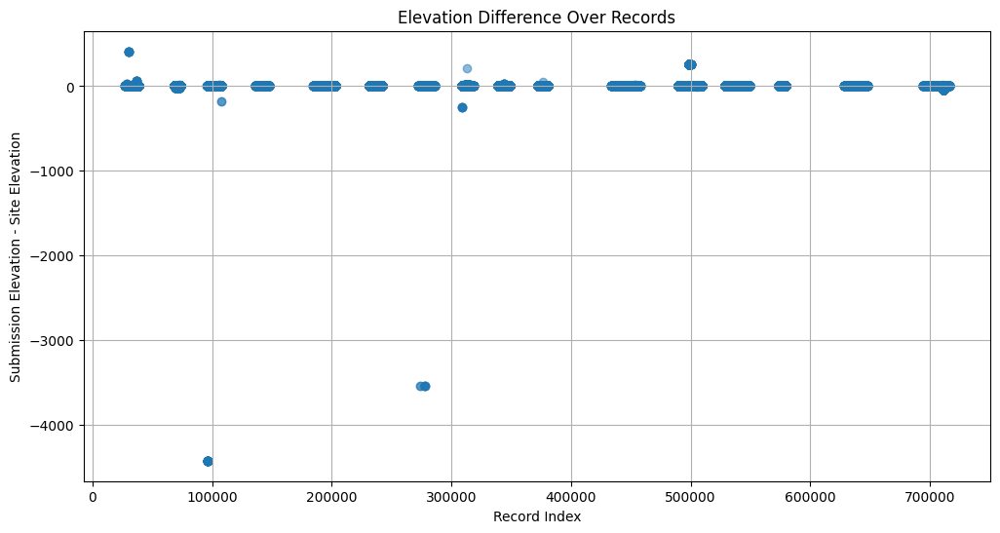

In [ ]:
df['elevation_diff'] = df['submission_elevation'] - df['site_elevation']

plt.figure(figsize=(12, 6))
plt.scatter(df.index, df['elevation_diff'], alpha=0.5)
plt.title("Elevation Difference Over Records")
plt.xlabel("Record Index")
plt.ylabel("Submission Elevation - Site Elevation")
plt.grid(True)
plt.show()

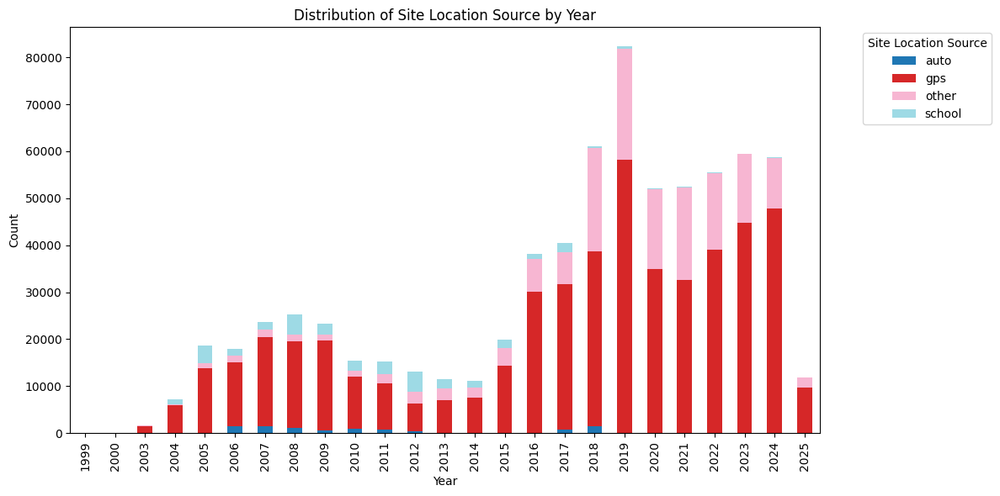

In [ ]:
df['measured_at'] = pd.to_datetime(df['measured_at'], errors='coerce')
df['year'] = df['measured_at'].dt.year

import matplotlib.pyplot as plt

# Get counts
counts = df.groupby(['year', 'site_location_source']).size().unstack(fill_value=0)

# Plot
counts.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title('Distribution of Site Location Source by Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Site Location Source', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Pairwise Plotting [Doesn't work]

In [ ]:
!pip install seaborn

In [ ]:
import seaborn as sns
import pandas as pd


sns.pairplot(df, diag_kind="kde")

NameError: name 'df' is not defined

Essential Unsupervised Preprocessing

In [ ]:
#Put stuff here

**Phase 2: Selecting and Applying Dimensionality Reduction Techniques**

Simple Feature Selection

In [ ]:
#Put Stuff here

Move to Feature Extraction

Linear PCA Loadings Heatmap

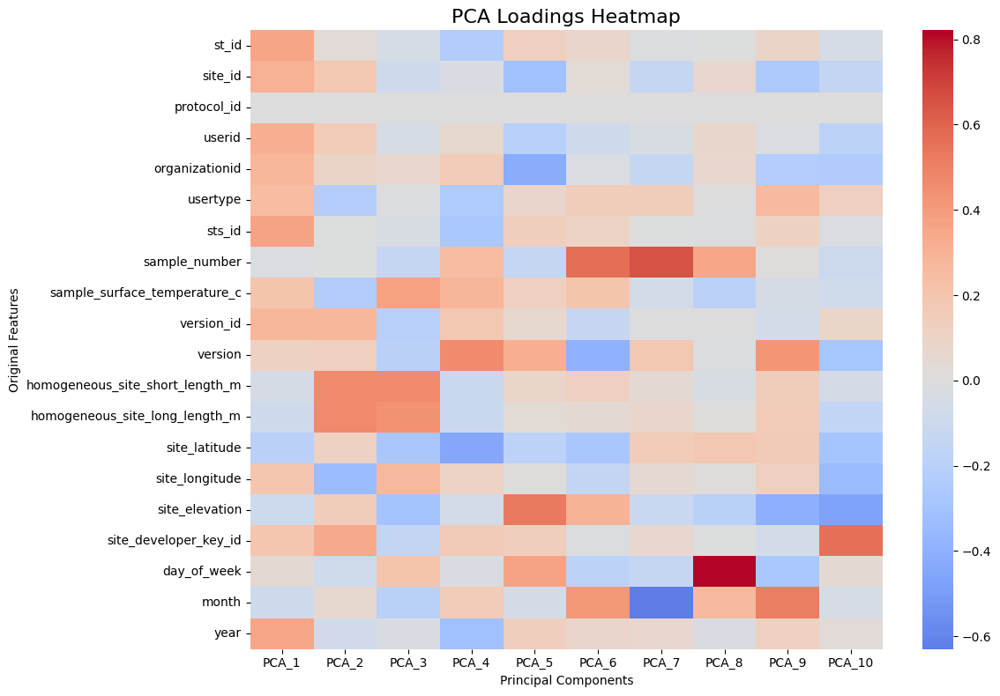

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# Load your data
df = pd.read_parquet('/content/mv_surface_temperatures_with_date_parts.parquet')

# Select numeric columns for PCA
# Drop columns with more than 50% missing values
filtered_df = df.dropna(thresh=len(df) * 0.5, axis=1)

# Then drop rows with nulls (optional: or fill them instead)
num_df = filtered_df.select_dtypes(include=['float', 'int']).dropna()



# Standardize
scaler = StandardScaler()
X = scaler.fit_transform(num_df)


pca = PCA(n_components=10)
pca.fit(X)

# Calculate loadings matrix: rows=features, cols=PCA components
loadings = pd.DataFrame(
    pca.components_.T,
    index=num_df.columns,
    columns=[f'PCA_{i+1}' for i in range(pca.n_components_)]
)

plt.figure(figsize=(12, 8))
sns.heatmap(loadings, cmap='coolwarm', center=0, annot=False)
plt.title('PCA Loadings Heatmap', fontsize=16)
plt.xlabel('Principal Components')
plt.ylabel('Original Features')
plt.tight_layout()
plt.show()


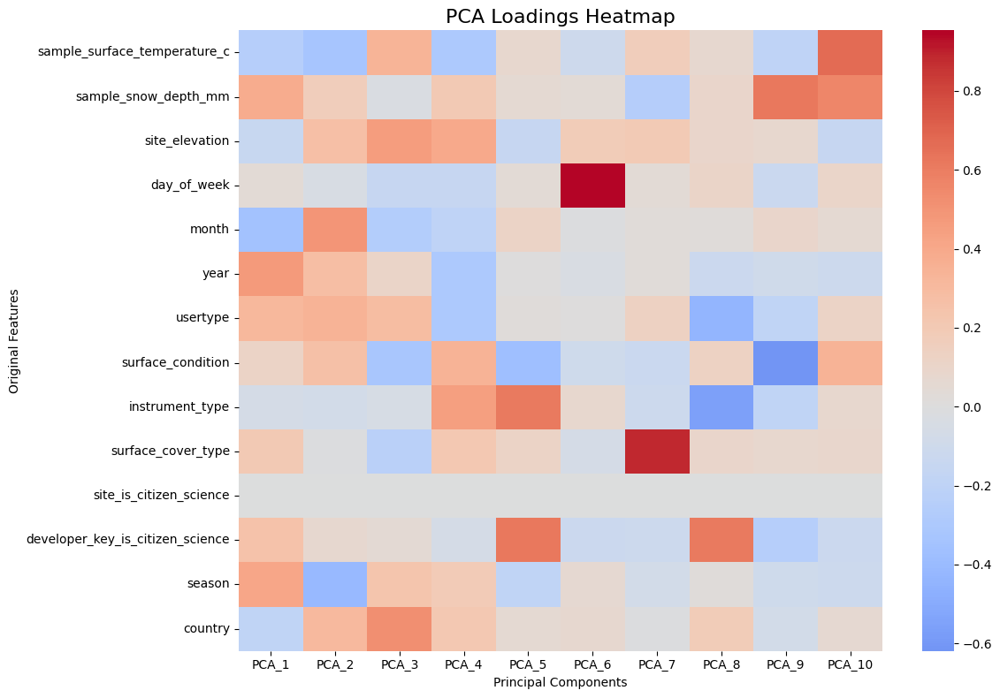

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

# Load your data
df = pd.read_parquet('/content/mv_surface_temperatures_with_date_parts.parquet')

# Selected columns (numeric + categorical)
selected_columns = [
    'sample_surface_temperature_c', 'sample_snow_depth_mm',
 'site_elevation',
    'day_of_week', 'month', 'year',
    'usertype', 'surface_condition', 'instrument_type',
    'surface_cover_type', 'site_is_citizen_science',
    'developer_key_is_citizen_science', 'season', 'country'
]


df = df[selected_columns].dropna()

# Identify categorical columns
categorical_cols = ['usertype', 'surface_condition', 'instrument_type',  'surface_cover_type', 'site_is_citizen_science', 'developer_key_is_citizen_science', 'season', 'country']
numeric_cols = [col for col in selected_columns if col not in categorical_cols]

# Encode categorical features using OrdinalEncoder (preserves column names)
encoder = OrdinalEncoder()
df[categorical_cols] = encoder.fit_transform(df[categorical_cols])


scaler = StandardScaler()
X = scaler.fit_transform(df)

# Run PCA
pca = PCA(n_components=10)
pca.fit(X)


loadings = pd.DataFrame(
    pca.components_.T,
    index=selected_columns,  # One row per original feature
    columns=[f'PCA_{i+1}' for i in range(pca.n_components_)]
)

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(loadings, cmap='coolwarm', center=0, annot=False)
plt.title("PCA Loadings Heatmap", fontsize=16)
plt.xlabel("Principal Components")
plt.ylabel("Original Features")
plt.tight_layout()
plt.show()


 **Phase 3: Evaluation and Iteration**

Quantify the Quality of the Uncovered Structure

In [ ]:
#Put Stuff here

Assess Information Preservation

In [ ]:
#Put Stuff here

Iterative Refinement

In [ ]:
#Put Stuff here

# **OUR Code**

Initial Data Characterization

In [ ]:
# Memory usage and types
df.info(memory_usage='deep')

# Summary stats for numeric columns
df.describe()

# If dataset is large:
import dask.dataframe as dd
ddf = dd.from_pandas(df, npartitions=4)
ddf.describe().compute()

# ydata profiling (if available)
from ydata_profiling import ProfileReport
profile = ProfileReport(df)
profile.to_notebook_iframe()


<class 'pandas.core.frame.DataFrame'>
Index: 97407 entries, 324 to 714462
Data columns (total 14 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   sample_surface_temperature_c      97407 non-null  float64
 1   sample_snow_depth_mm              97407 non-null  float64
 2   site_elevation                    97407 non-null  float64
 3   day_of_week                       97407 non-null  int32  
 4   month                             97407 non-null  int32  
 5   year                              97407 non-null  int32  
 6   usertype                          97407 non-null  float64
 7   surface_condition                 97407 non-null  float64
 8   instrument_type                   97407 non-null  float64
 9   surface_cover_type                97407 non-null  float64
 10  site_is_citizen_science           97407 non-null  float64
 11  developer_key_is_citizen_science  97407 non-null  float64
 12  season

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:01<00:00, 11.53it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

EDA

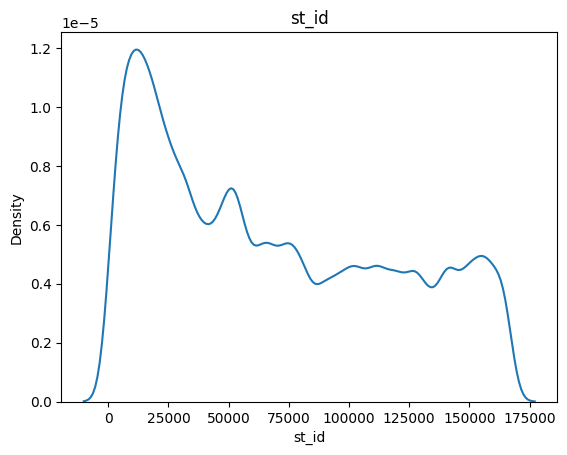

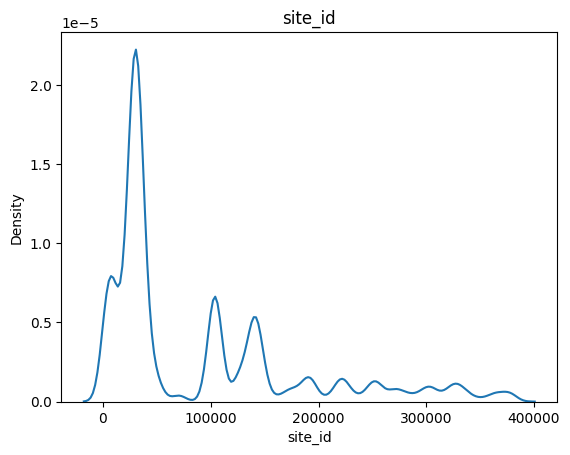

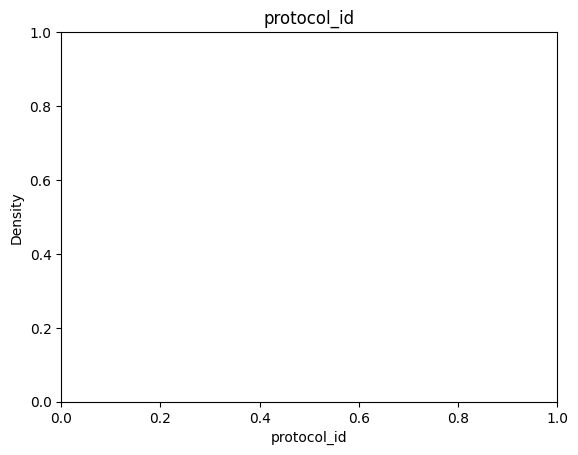

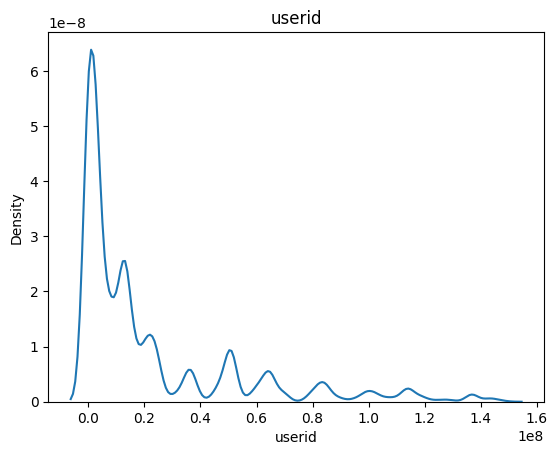

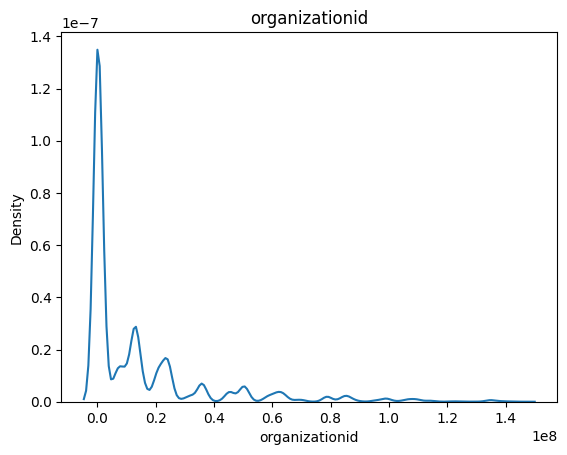

...

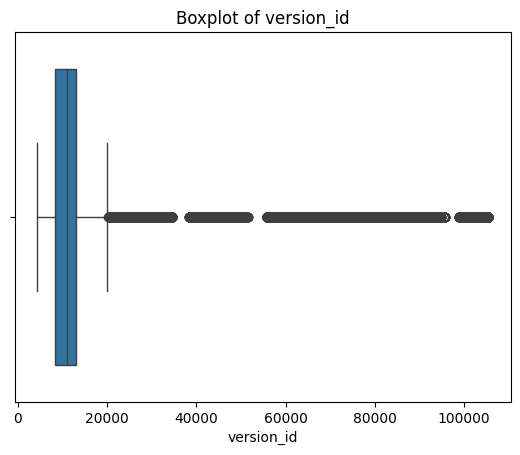

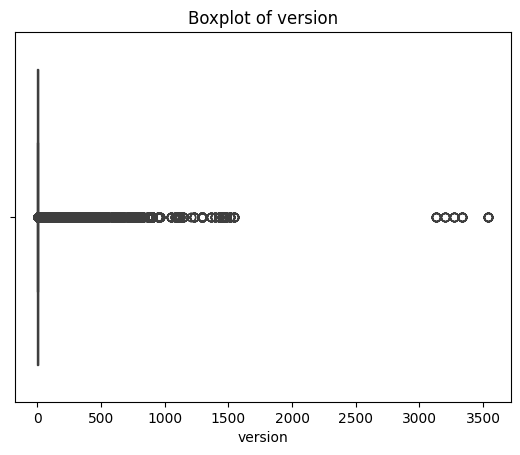

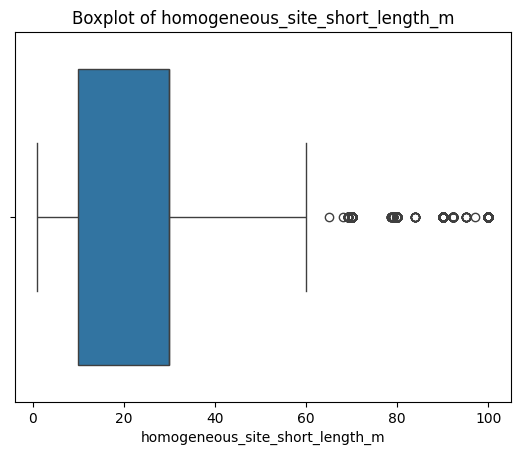

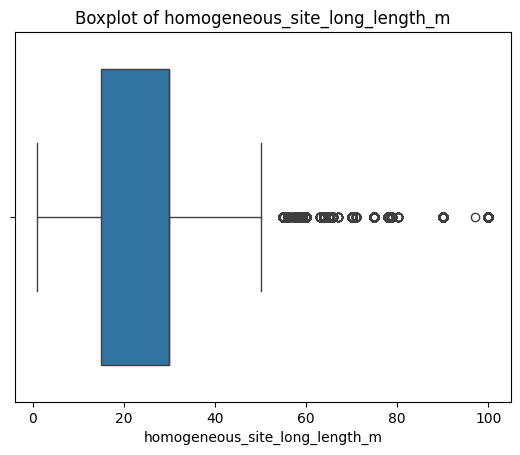

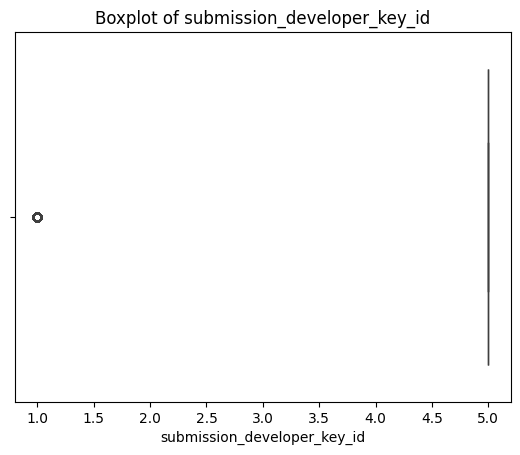

ValueError: List of boxplot statistics and `positions` values must have same the length

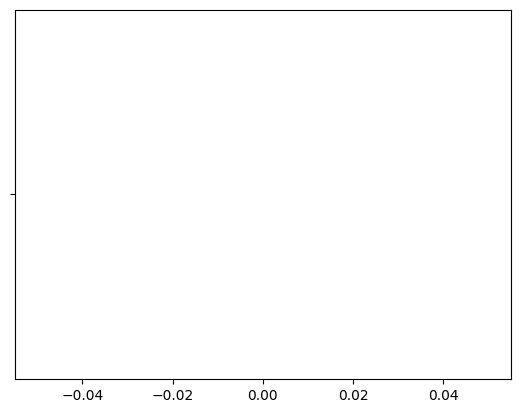

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# KDEs and histograms
for col in df.select_dtypes(include='number').columns:
    sns.kdeplot(df[col].dropna())
    plt.title(col)
    plt.show()

# Correlation matrix
corr = df.corr(numeric_only=True)
sns.heatmap(corr, annot=False, cmap='coolwarm')

# Pairwise plots (limit to a few columns)
subset = df.select_dtypes(include='number').iloc[:, :5]  # adjust as needed
sns.pairplot(subset)

# Boxplots to find outliers
for col in df.select_dtypes(include='number').columns:
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")
    plt.show()


🧠 Dataset Overvziew
(716031, 69)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 716031 entries, 0 to 716030
Data columns (total 69 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   st_id                             716031 non-null  Int64         
 1   site_id                           716031 non-null  Int64         
 2   measured_at                       716031 non-null  datetime64[ns]
 3   protocol_id                       716031 non-null  Int64         
 4   userid                            716031 non-null  Int64         
 5   surface_condition                 584465 non-null  object        
 6   organizationid                    716031 non-null  int64         
 7   usertype                          716031 non-null  Int64         
 8   submission_id                     90065 non-null   Int64         
 9   st_updated_at                     716031 non-null  object        
 10 

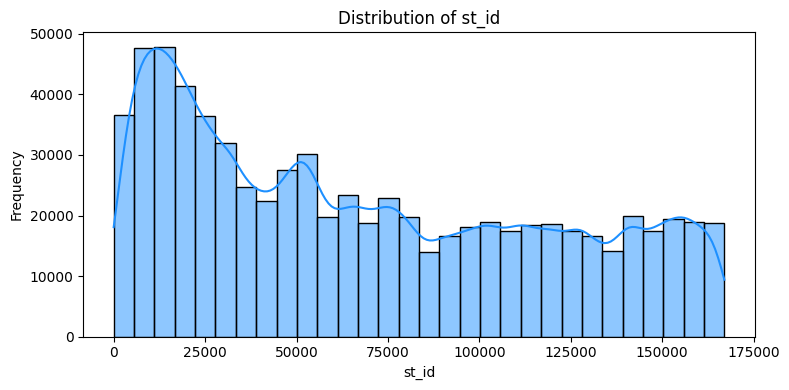

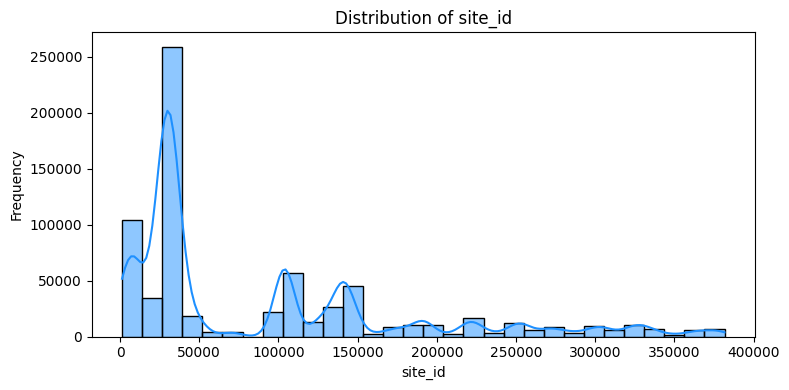

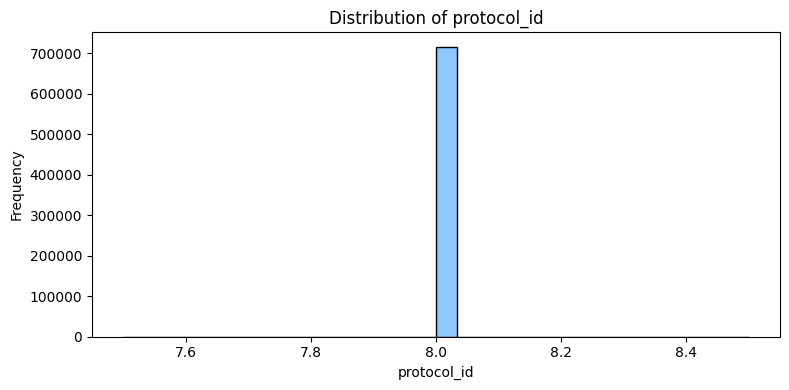

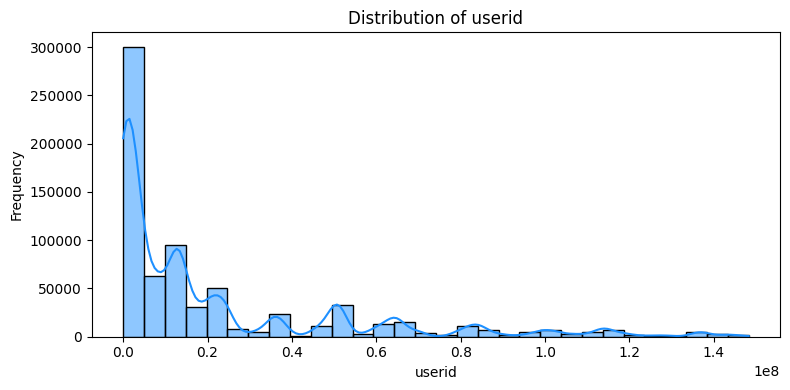

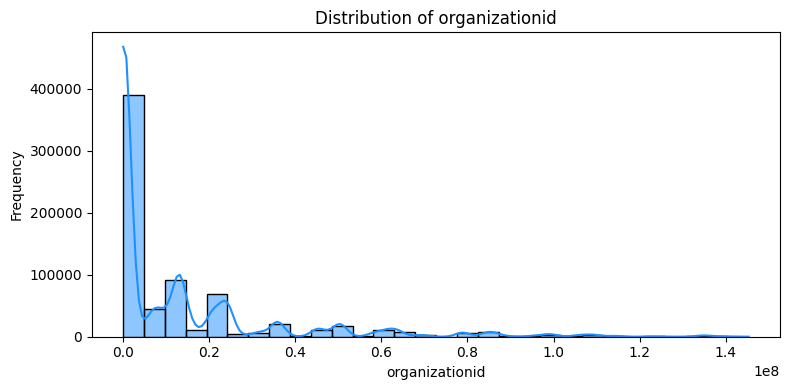

...

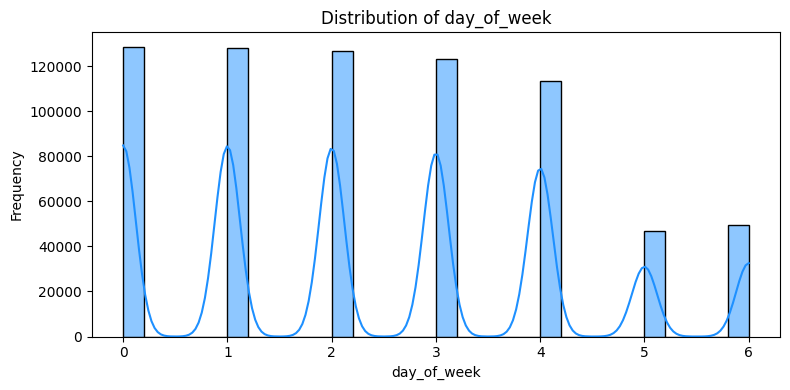

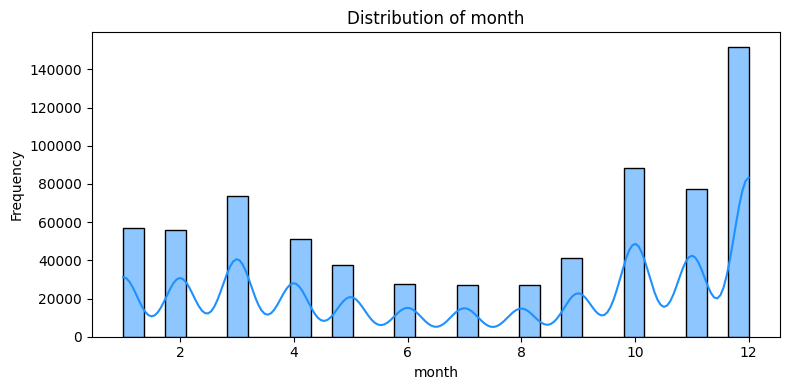

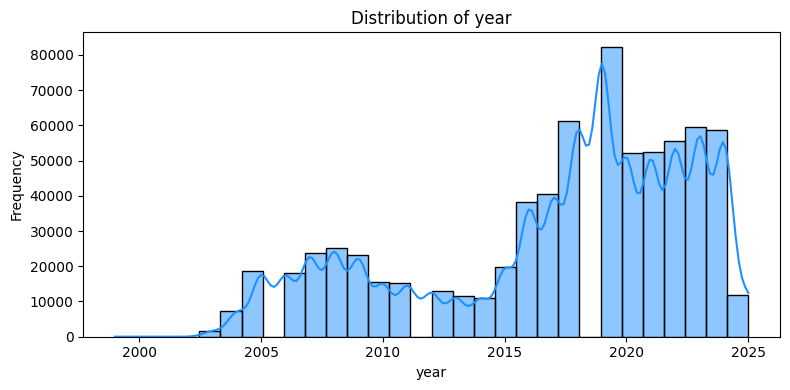

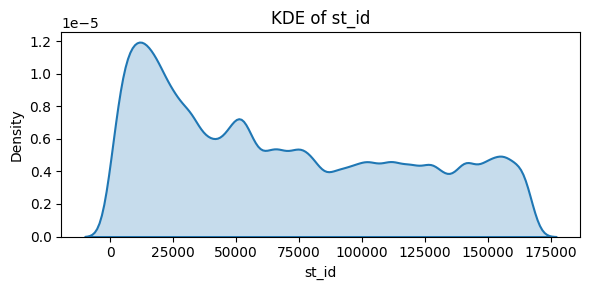

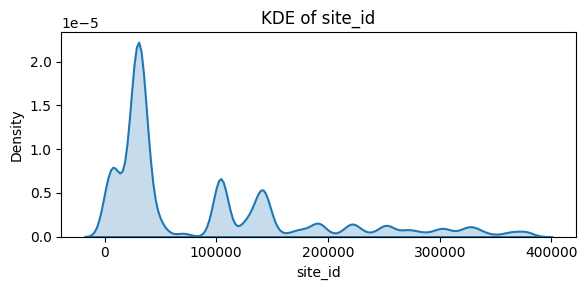

/tmp/ipython-input-4-4209618010.py:40: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, fill=True, linewidth=1.5)


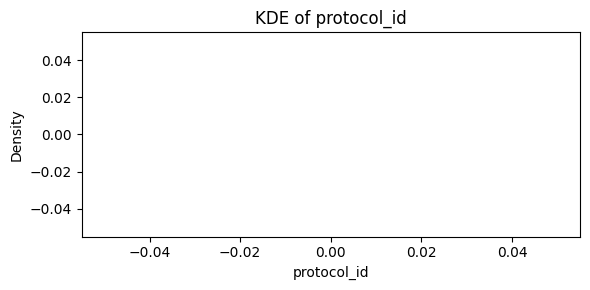

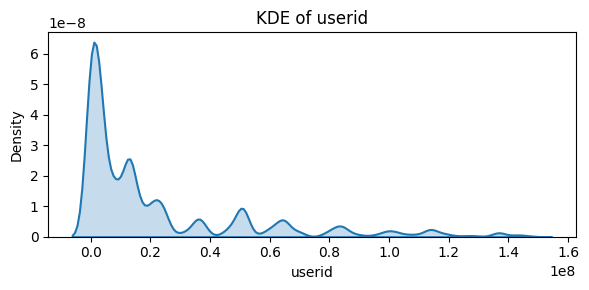

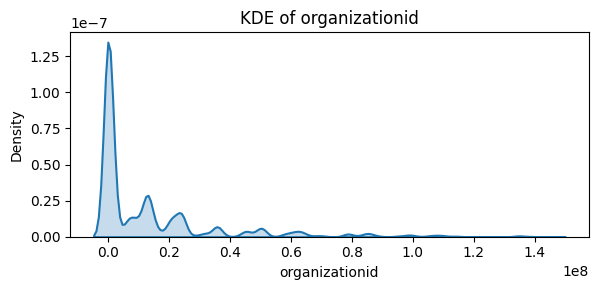

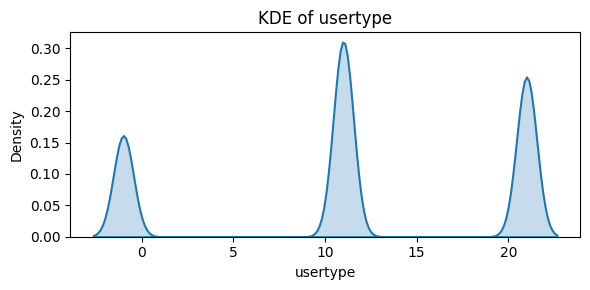

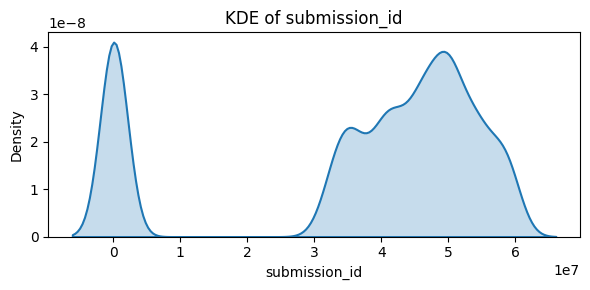

...

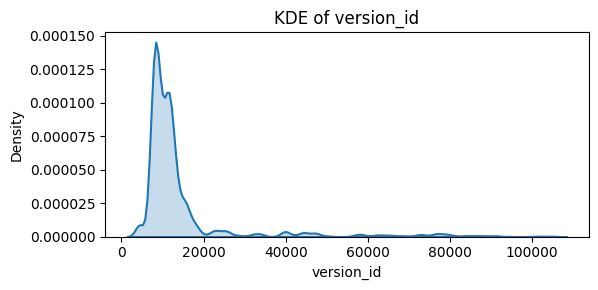

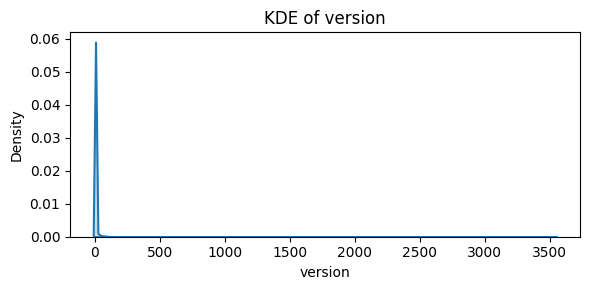

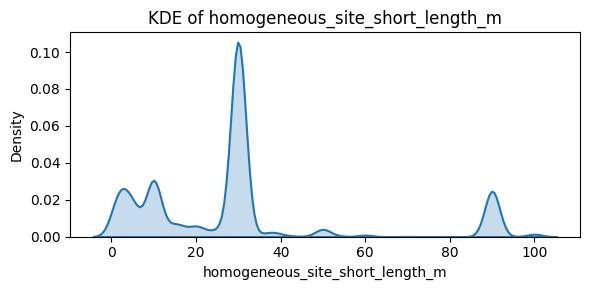

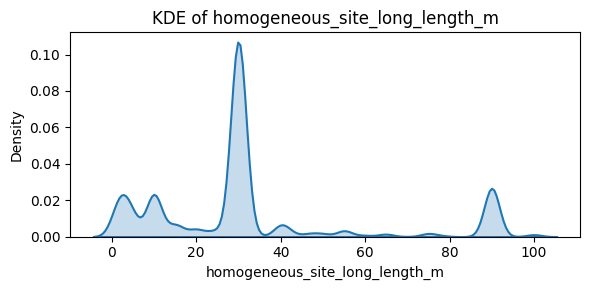

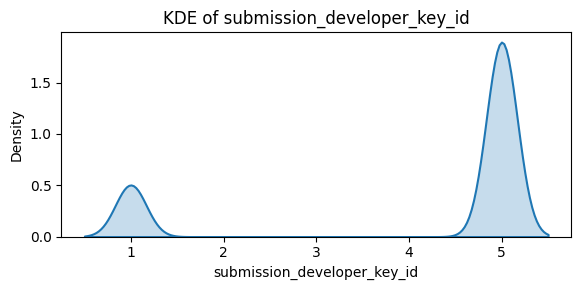

/tmp/ipython-input-4-4209618010.py:40: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, fill=True, linewidth=1.5)


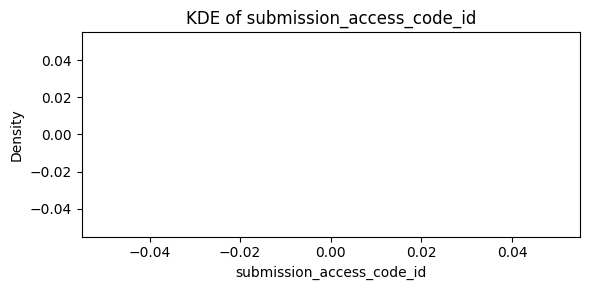

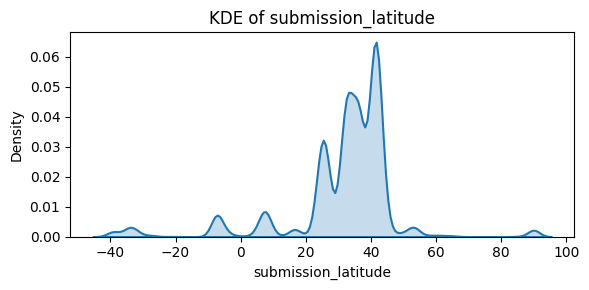

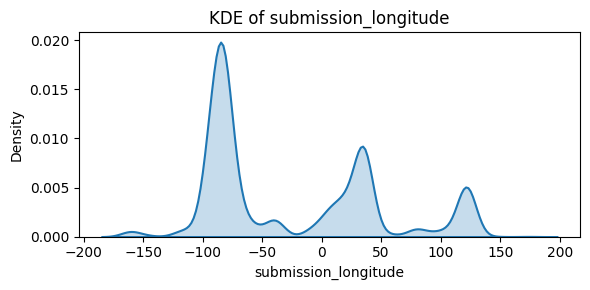

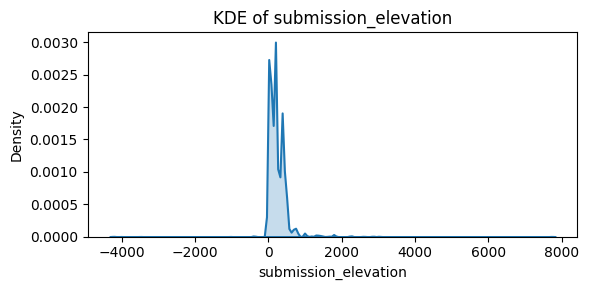

/tmp/ipython-input-4-4209618010.py:40: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, fill=True, linewidth=1.5)


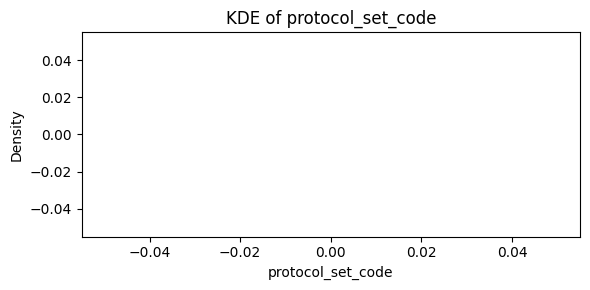

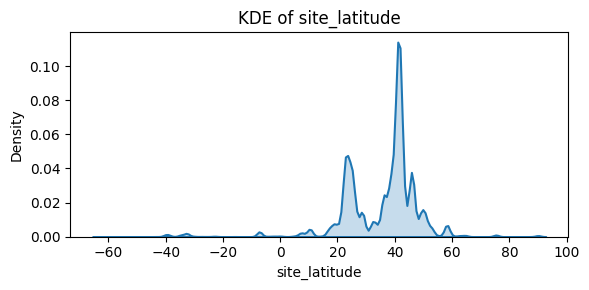

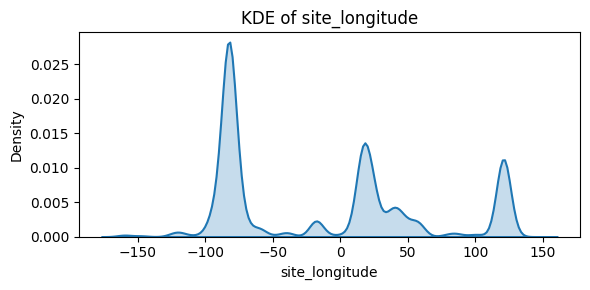

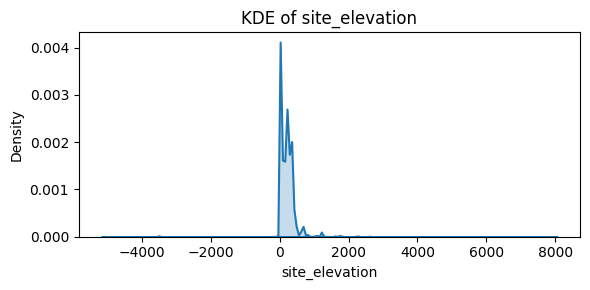

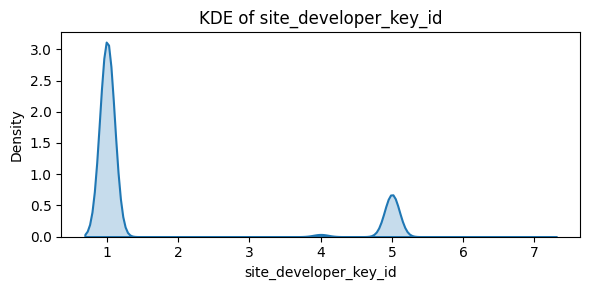

...

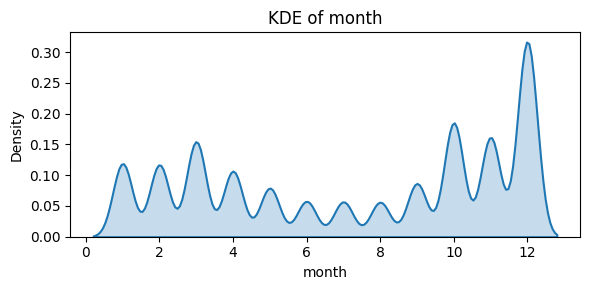

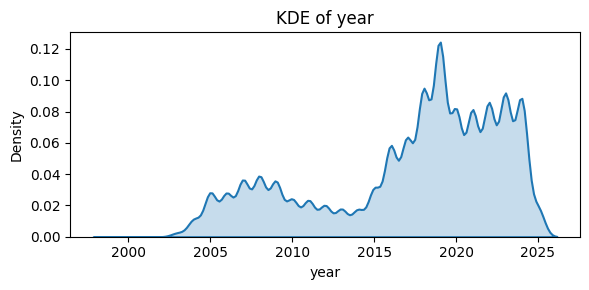

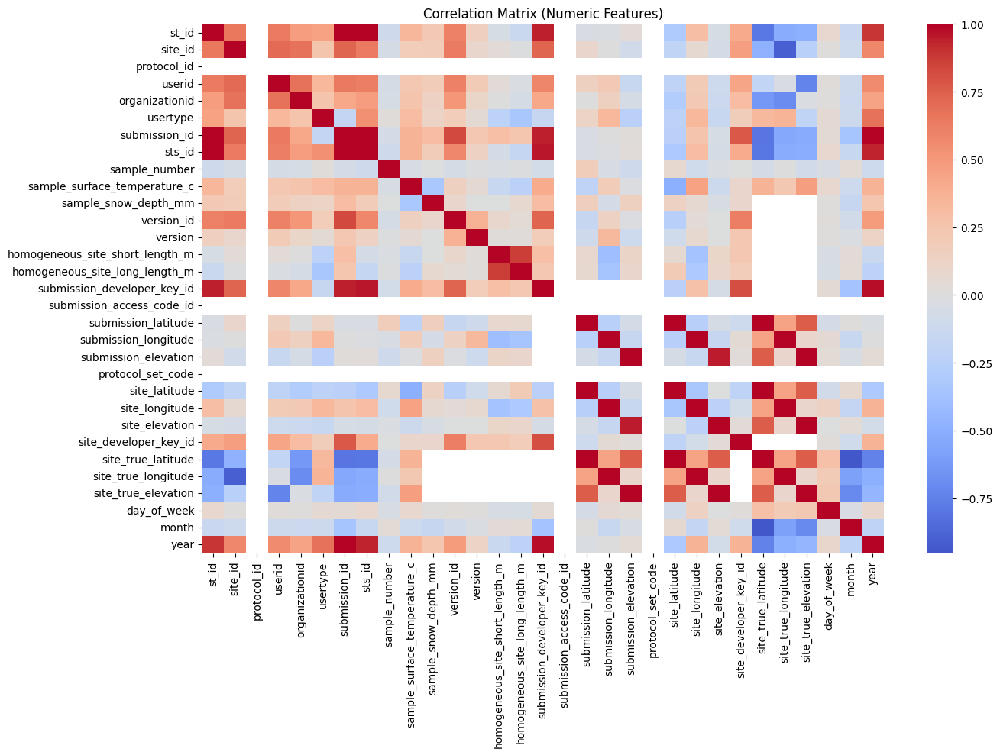

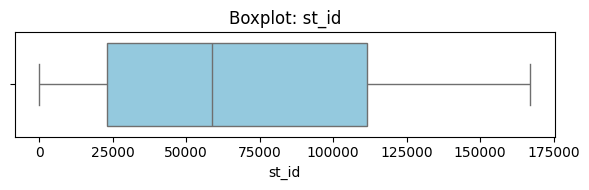

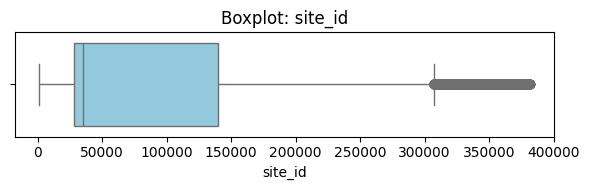

⚠️ Skipping boxplot for 'protocol_id': not enough unique values.


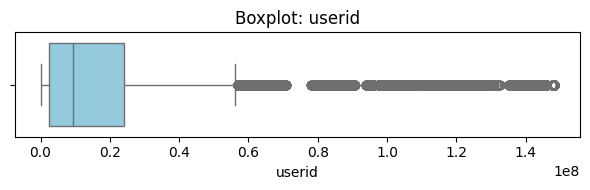

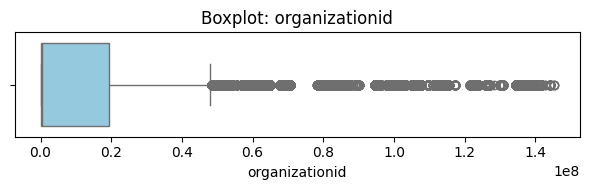

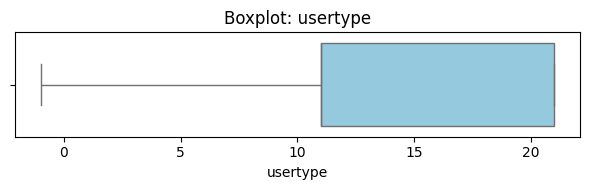

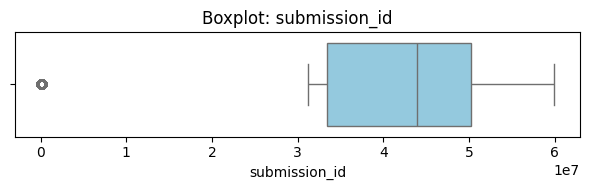

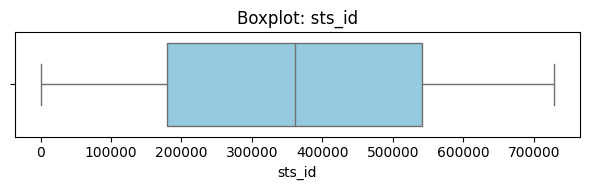

...

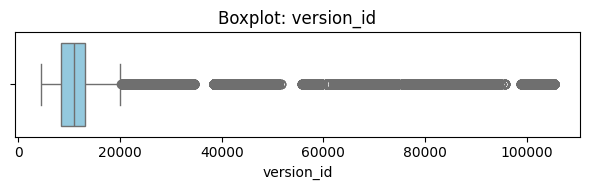

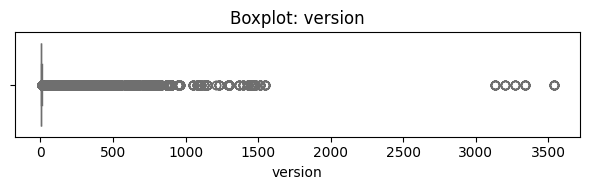

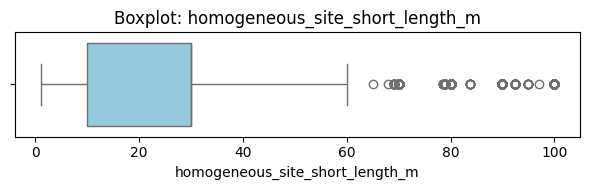

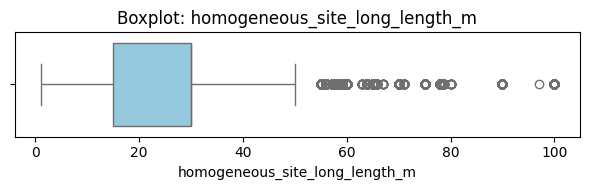

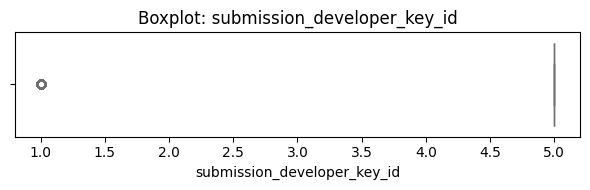

⚠️ Skipping boxplot for 'submission_access_code_id': not enough unique values.


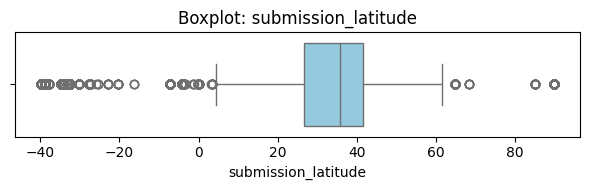

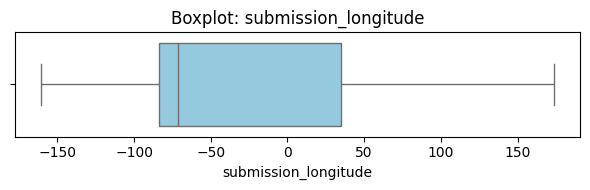

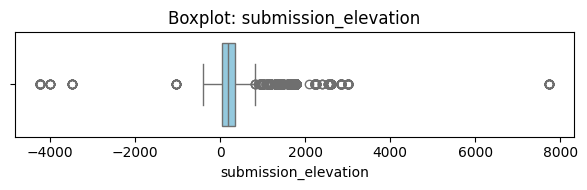

⚠️ Skipping boxplot for 'protocol_set_code': not enough unique values.


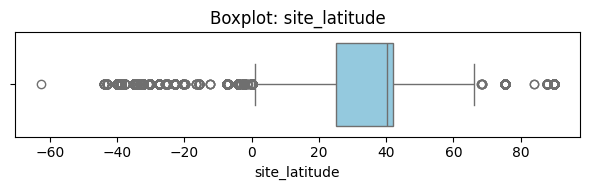

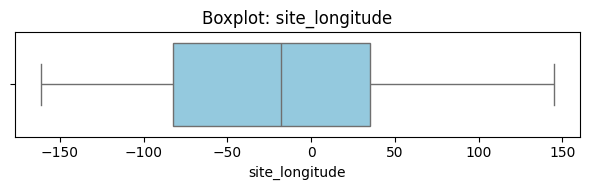

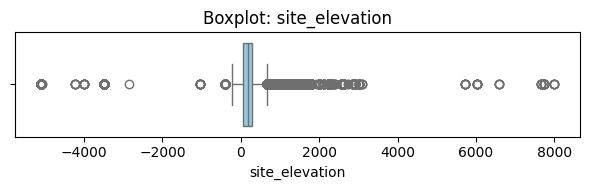

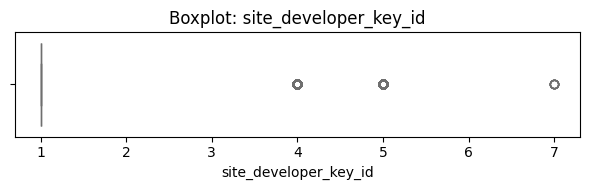

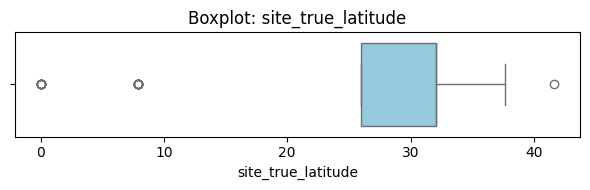

...

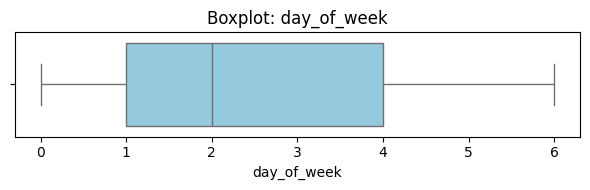

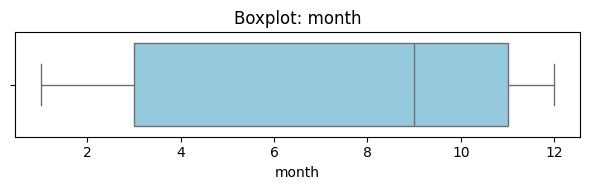

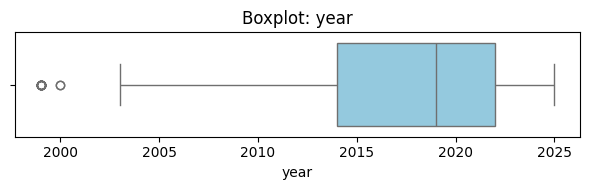

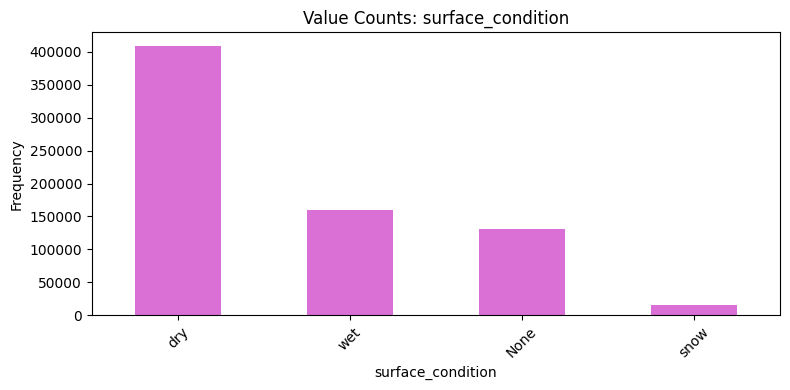

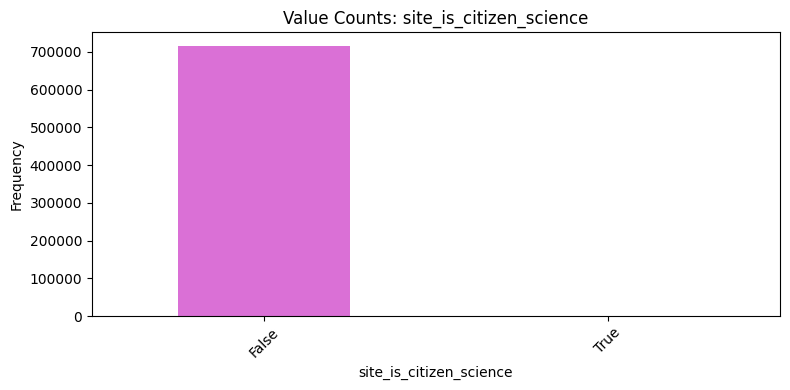

/tmp/ipython-input-4-4209618010.py:83: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


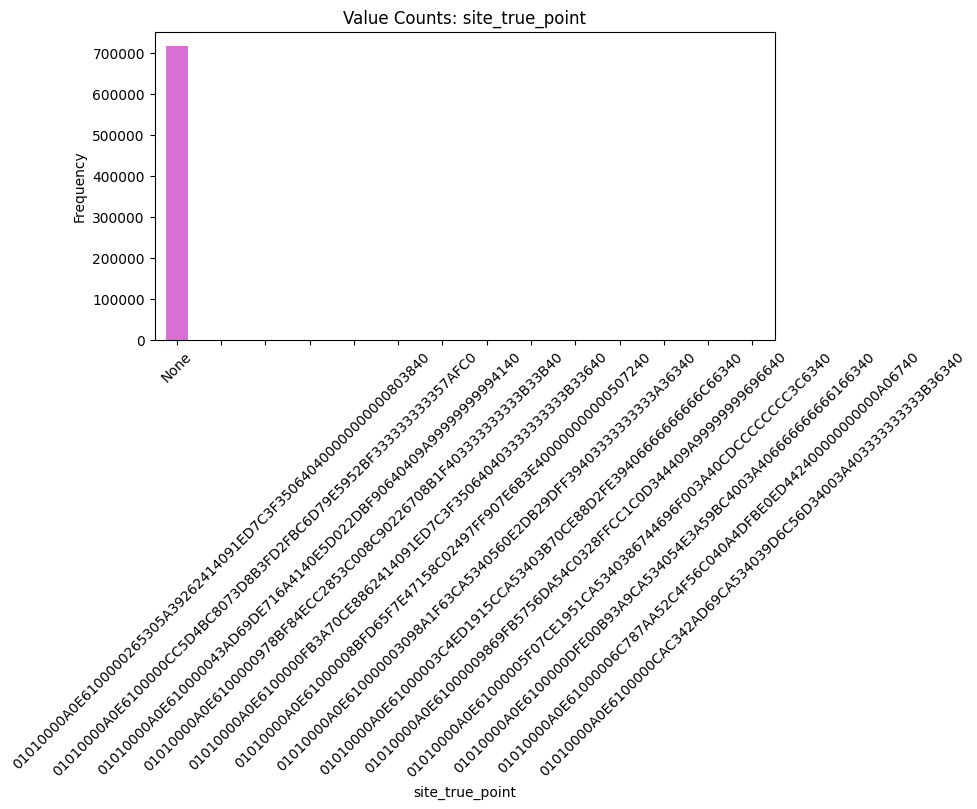

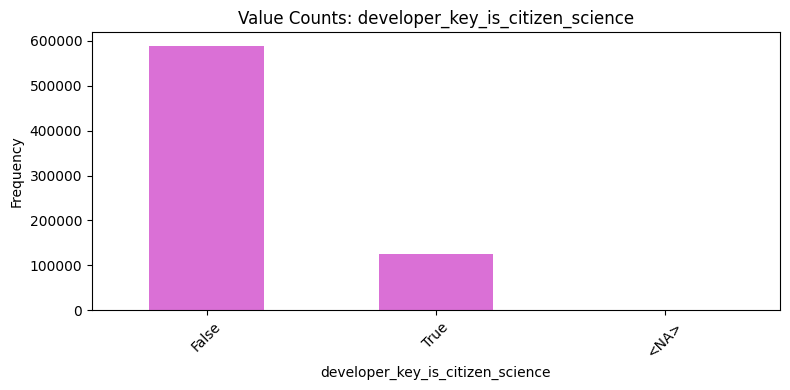

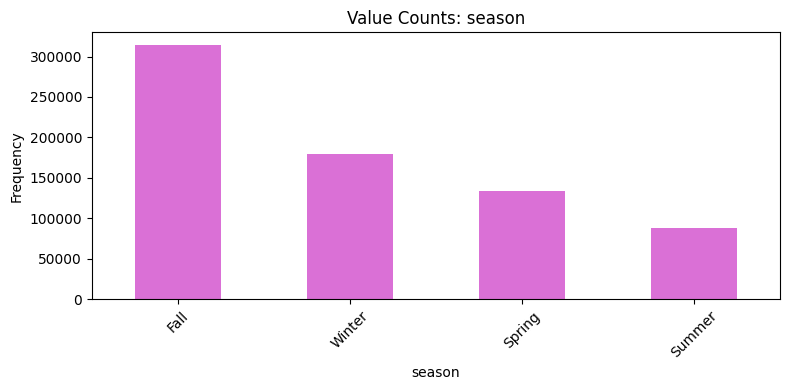

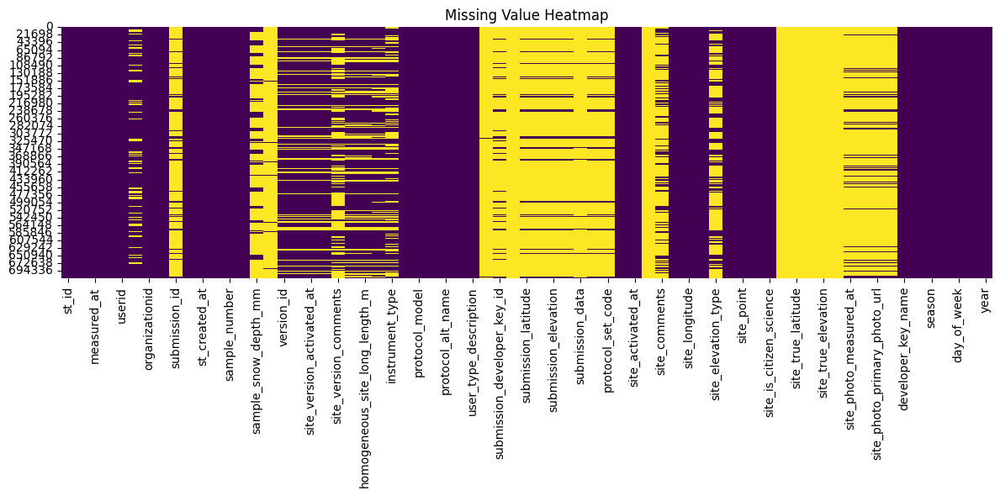


📉 Low-Variance Columns (may not help PCA or clustering):
 - protocol_id: variance = 0.000000
 - protocol_set_code: variance = 0.000000


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
df = pd.read_parquet('/content/mv_surface_temperatures_with_date_parts.parquet')


# 1. Basic Overview

print("🧠 Dataset Overvziew")
print(df.shape)
print(df.info(memory_usage='deep'))
print(df.describe(include='all').T)


# 2. Identify Column Types

numeric_cols = df.select_dtypes(include=['float', 'int']).columns.tolist()
cat_cols = df.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()


# 3. Histograms + KDEs

for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], bins=30, kde=True, color='dodgerblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


# 4. Individual KDE Plots (Zoomed Look)

for col in numeric_cols:
    plt.figure(figsize=(6, 3))
    sns.kdeplot(data=df, x=col, fill=True, linewidth=1.5)
    plt.title(f'KDE of {col}')
    plt.xlabel(col)
    plt.tight_layout()
    plt.show()


# 5. Correlation Heatmap

if len(numeric_cols) > 1:
    plt.figure(figsize=(14, 10))
    corr = df[numeric_cols].corr()
    sns.heatmap(corr, cmap='coolwarm', center=0, annot=False, fmt=".2f")
    plt.title('Correlation Matrix (Numeric Features)')
    plt.tight_layout()
    plt.show()


# 6. Boxplots (Outlier Detection)

for col in numeric_cols:
    data = df[col].dropna()
    if data.nunique() > 1:  # Only plot if there's variation
        plt.figure(figsize=(6, 2))
        sns.boxplot(x=data, color='skyblue')
        plt.title(f'Boxplot: {col}')
        plt.tight_layout()
        plt.show()
    else:
        print(f"⚠️ Skipping boxplot for '{col}': not enough unique values.")


# 7. Categorical Frequency Distributions

for col in cat_cols:
    if df[col].nunique() <= 20:
        plt.figure(figsize=(8, 4))
        df[col].value_counts(dropna=False).plot(kind='bar', color='orchid')
        plt.title(f'Value Counts: {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


# 8. Missing Value Heatmap

plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Value Heatmap")
plt.tight_layout()
plt.show()


# 9. Variance Check for Structure Discovery

variances = df[numeric_cols].var().sort_values()
low_var_cols = variances[variances < 1e-3].index.tolist()

print("\n📉 Low-Variance Columns (may not help PCA or clustering):")
for col in low_var_cols:
    print(f" - {col}: variance = {variances[col]:.6f}")


Essential Preprocessing

In [ ]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from scipy import sparse

# --- 1. Handle numerics ---
numeric_cols = df.select_dtypes(include='number').columns
X_num = df[numeric_cols]

# Impute missing values with median (fast)
num_imputer = SimpleImputer(strategy='median')
X_num_imputed = num_imputer.fit_transform(X_num)

# Scale
scaler = RobustScaler()
X_num_scaled = scaler.fit_transform(X_num_imputed)

# Convert to sparse matrix
X_num_sparse = sparse.csr_matrix(X_num_scaled)

# --- 2. Handle categoricals ---
categorical_cols = df.select_dtypes(include='object').columns
X_cat = df[categorical_cols].fillna('missing')

# Encode with sparse output
encoder = OneHotEncoder(sparse_output=True, handle_unknown='ignore')
X_cat_encoded = encoder.fit_transform(X_cat)

# --- 3. Combine efficiently ---
X_processed = sparse.hstack([X_num_sparse, X_cat_encoded]).tocsr()

# --- 4. Result ---
print(f"Final processed shape: {X_processed.shape}")
print(f"Matrix type: {type(X_processed)}")



Final processed shape: (97407, 14)
Matrix type: <class 'scipy.sparse._csr.csr_matrix'>


Phase 2: Dimensionality Reduction

In [ ]:
from sklearn.feature_selection import VarianceThreshold
from scipy import sparse

# --- 1. Remove near-zero variance features (works on sparse matrix) ---
sel = VarianceThreshold(threshold=0.01)
X_filtered = sel.fit_transform(X_processed)

print(f"Shape after variance filter: {X_filtered.shape}")



Shape after variance filter: (97407, 13)


In [ ]:
X_dense = X_filtered.toarray() if sparse.issparse(X_filtered) else X_filtered

from sklearn.decomposition import PCA

pca = PCA(n_components=10, svd_solver='full', random_state=42)
X_pca = pca.fit_transform(X_dense)

PCA

TruncatedSVD shape: (716031, 50)


Analyzed Explained Variance

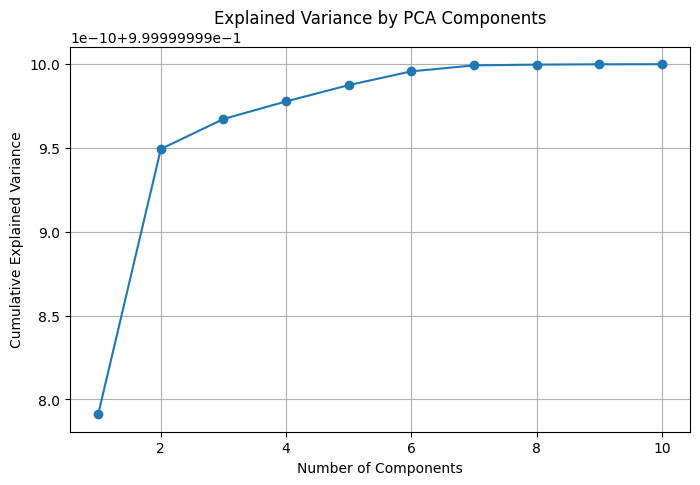

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8,5))
plt.plot(np.arange(1, 11), np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA Components')
plt.grid(True)
plt.show()


In [ ]:
print("Number of components:", pca.n_components_)
print("Explained variance ratio:", pca.explained_variance_ratio_)

Number of components: 10
Explained variance ratio: [9.69711475e-01 2.40524667e-02 1.69783634e-03 1.23455750e-03
 8.96757725e-04 7.23467992e-04 6.54680934e-04 2.86357214e-04
 2.47229252e-04 2.25394549e-04]


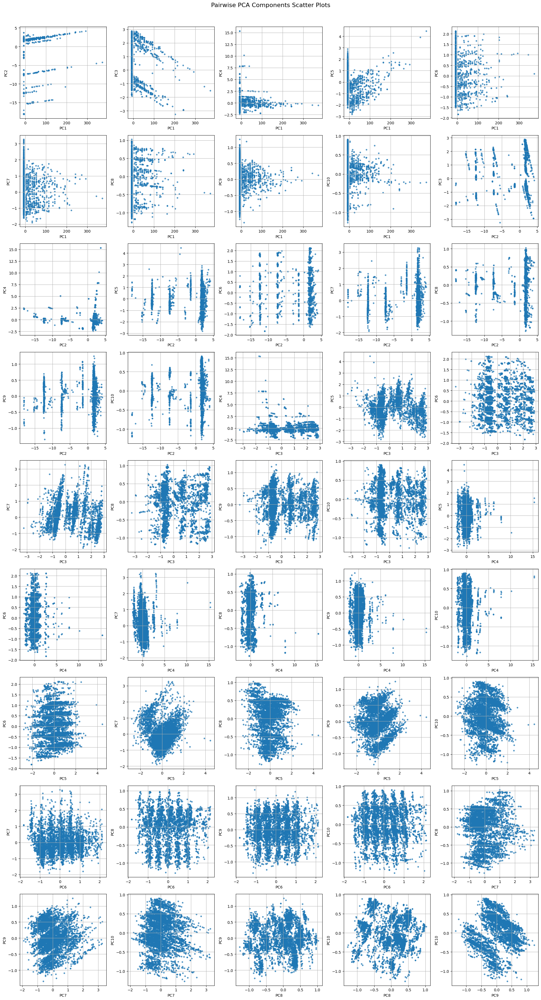

In [ ]:
import matplotlib.pyplot as plt
import itertools
import numpy as np

# Sample data (optional, if your dataset is huge)
sample_size = 5000
if X_pca.shape[0] > sample_size:
    idx = np.random.choice(X_pca.shape[0], sample_size, replace=False)
    X_sample = X_pca[idx, :10]
else:
    X_sample = X_pca[:, :10]

pcs_to_plot = 10
pairs = list(itertools.combinations(range(pcs_to_plot), 2))
num_plots = len(pairs)  # 45 for 10 PCs

# Define grid size (e.g. 9 rows x 5 columns)
n_cols = 5
n_rows = int(np.ceil(num_plots / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*4, n_rows*4))
axes = axes.flatten()  # Flatten to 1D for easy iteration

for ax, (pc_x, pc_y) in zip(axes, pairs):
    ax.scatter(X_sample[:, pc_x], X_sample[:, pc_y], s=10, alpha=0.7)
    ax.set_xlabel(f'PC{pc_x + 1}')
    ax.set_ylabel(f'PC{pc_y + 1}')
    ax.grid(True)

# Turn off any unused subplots
for ax in axes[num_plots:]:
    ax.axis('off')

plt.tight_layout()
plt.suptitle('Pairwise PCA Components Scatter Plots', y=1.02, fontsize=16)
plt.show()



UMAP

In [ ]:
import umap

reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_umap = reducer.fit_transform(X_deduped)


NameError: name 'X_deduped' is not defined

t-SNE

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load your dataset
df = pd.read_parquet('/content/mv_surface_temperatures_with_date_parts.parquet')

# 2. Drop columns with >50% missing values
df_reduced = df.dropna(thresh=len(df) * 0.5, axis=1)

# 3. Select numeric columns only, and drop remaining NaNs
df_tsne = df_reduced.select_dtypes(include=['float64', 'int64']).dropna()

# 4. Sample size, random state for reproducibility
df_tsne = df_tsne.sample(n=min(5000, len(df_tsne)), random_state=42)


# 5. Standardize the data
X_scaled = StandardScaler().fit_transform(df_tsne)

# 6. PCA for dimensionality reduction before t-SNE
n_features = X_scaled.shape[1]
n_pca_components = min(n_features, 50)
pca = PCA(n_components=n_pca_components, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# 7. Run t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
X_tsne = tsne.fit_transform(X_pca)

# 8. Create DataFrame for plotting
df_vis = pd.DataFrame(X_tsne, columns=['TSNE_1', 'TSNE_2'])

# Optional: add 'surface_condition' if available
if 'surface_condition' in df.columns:
    df_vis['surface_condition'] = df['surface_condition'].values[:len(df_vis)]

# 9. Plot the t-SNE results
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='TSNE_1', y='TSNE_2',
    hue='surface_condition' if 'surface_condition' in df_vis.columns else None,
    data=df_vis, palette='tab10', alpha=0.7, s=50
)
plt.title("t-SNE 2D Visualization of Surface Temperature Dataset")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


KeyboardInterrupt: 

Incremental PCA

In [ ]:
from sklearn.decomposition import IncrementalPCA

ipca = IncrementalPCA(n_components=50, batch_size=256)
X_ipca = ipca.fit_transform(X_deduped)


NameError: name 'X_deduped' is not defined

Phase 3: Evaluation and Iteration

Cluster Validation Metrics

Silouette Score

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(X_pca)


kmeans_umap = KMeans(n_clusters=5, random_state=42)
labels_umap = kmeans.fit_predict(X_umap)
print("Silhouette for PCA:", silhouette_score(X_pca, labels))
print("Calinski-Harabasz for PCA:", calinski_harabasz_score(X_pca, labels))
print("Davies-Bouldin for PCA:", davies_bouldin_score(X_pca, labels))

print("Silhouette for UMAP:", silhouette_score(X_umap, labels_umap))
print("Calinski-Harabasz for UMAP:", calinski_harabasz_score(X_umap, labels_umap))
print("Davies-Bouldin for UMAP:", davies_bouldin_score(X_umap, labels_umap))


print("Silhouette Score for t-SNE:", silhouette_score(X_tsne, labels))
print("Calinski-Harabasz Index for t-SNE :", calinski_harabasz_score(X_tsne, labels))
print("Davies-Bouldin Index for t-SNE:", davies_bouldin_score(X_tsne, labels))


Silhouette for PCA: 0.3692990476744364
Calinski-Harabasz for PCA: 5127.773373701683
Davies-Bouldin for PCA: 0.9047262731971264
Silhouette for UMAP: 0.6032093
Calinski-Harabasz for UMAP: 9531.125
Davies-Bouldin for UMAP: 0.5425864814524675
Silhouette Score for t-SNE: 0.11391201
Calinski-Harabasz Index for t-SNE : 1568.5642
Davies-Bouldin Index for t-SNE: 1.8134204458318952


Assess Reconstruction (PCA Only)

In [ ]:
X_reconstructed = pca.inverse_transform(X_pca)
mse = np.mean((X_deduped - X_reconstructed)**2)
print("Reconstruction Error (MSE):", mse)


NameError: name 'X_deduped' is not defined

Visualize Clusters

PCA vs UMAP (1 and 2)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


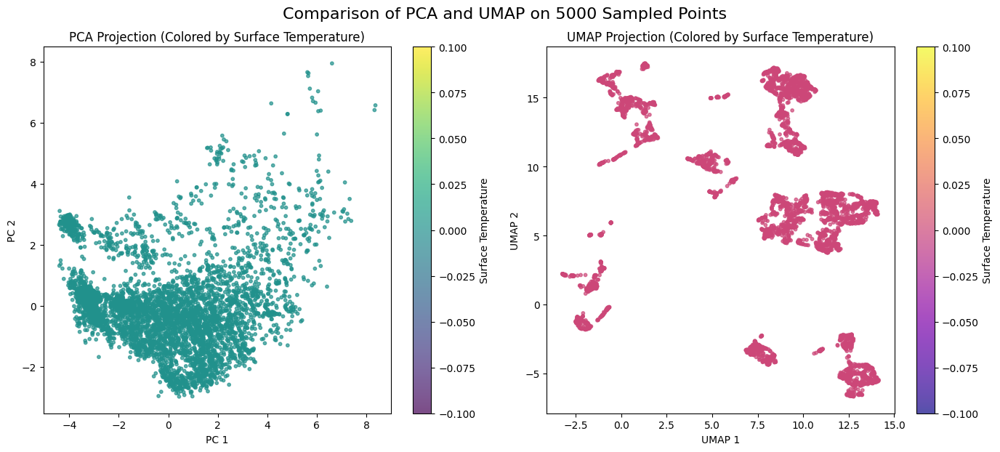

PCA vs UMAP vs t-SNE (Side-by-Side Comparison)

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


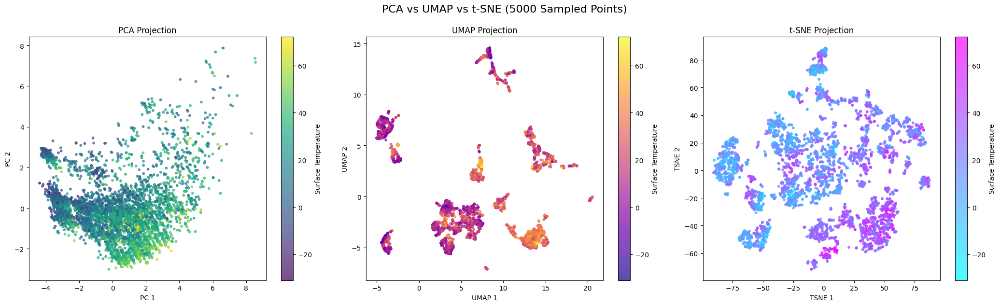

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

# --- Load and clean data ---
df = pd.read_parquet("mv_surface_temperatures_with_date_parts.parquet")

# Keep only numeric columns with at least 50% non-null, then fill remaining NaNs
df_numeric = df.select_dtypes(include='number').dropna(axis=1, thresh=len(df)*0.5).fillna(0)

# --- Standardize the numeric data ---
scaled = StandardScaler().fit_transform(df_numeric)

# --- Sample 5000 random rows ---
sample_size = 5000
sample_idx = np.random.choice(df_numeric.shape[0], size=sample_size, replace=False)
scaled_sample = scaled[sample_idx]
df_sample = df_numeric.iloc[sample_idx]

# --- Color labels ---
if "sample_surface_temperature_c" in df_sample.columns:
    labels = df_sample["sample_surface_temperature_c"].values
else:
    labels = np.zeros(sample_size)

# --- PCA ---
X_pca = PCA(n_components=2, random_state=42).fit_transform(scaled_sample)

# --- UMAP ---
X_umap = umap.UMAP(n_components=2, random_state=42).fit_transform(scaled_sample)

# --- t-SNE ---
X_tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42).fit_transform(scaled_sample)

# --- Plot all 3 side-by-side ---
fig, axes = plt.subplots(1, 3, figsize=(21, 6))

# PCA Plot
p1 = axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', s=10, alpha=0.7)
axes[0].set_title("PCA Projection")
axes[0].set_xlabel("PC 1")
axes[0].set_ylabel("PC 2")
plt.colorbar(p1, ax=axes[0], label="Surface Temperature")

# UMAP Plot
p2 = axes[1].scatter(X_umap[:, 0], X_umap[:, 1], c=labels, cmap='plasma', s=10, alpha=0.7)
axes[1].set_title("UMAP Projection")
axes[1].set_xlabel("UMAP 1")
axes[1].set_ylabel("UMAP 2")
plt.colorbar(p2, ax=axes[1], label="Surface Temperature")

# t-SNE Plot
p3 = axes[2].scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='cool', s=10, alpha=0.7)
axes[2].set_title("t-SNE Projection")
axes[2].set_xlabel("TSNE 1")
axes[2].set_ylabel("TSNE 2")
plt.colorbar(p3, ax=axes[2], label="Surface Temperature")

plt.tight_layout()
plt.suptitle("PCA vs UMAP vs t-SNE (5000 Sampled Points)", y=1.05, fontsize=16)
plt.show()


UMAP

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

Saving mv_surface_temperatures_with_date_parts.parquet to mv_surface_temperatures_with_date_parts.parquet


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


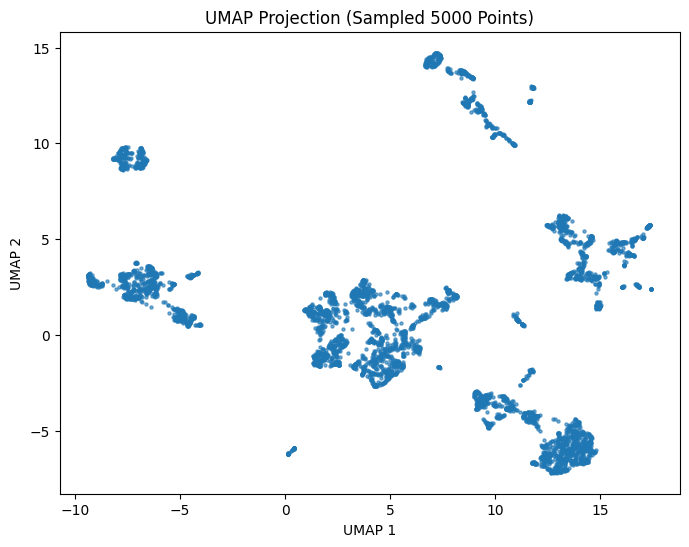

In [ ]:

from google.colab import files
uploaded = files.upload()
# Load parquet file
df = pd.read_parquet("mv_surface_temperatures_with_date_parts.parquet")

# Keep numeric columns and fill missing values
df_numeric = df.select_dtypes(include='number').dropna(axis=1, thresh=len(df)*0.5).fillna(0)

# Scale
scaled = StandardScaler().fit_transform(df_numeric)

# Sample 5000 points
sample_idx = np.random.choice(scaled.shape[0], size=5000, replace=False)
scaled_sample = scaled[sample_idx]

# UMAP
X_UMAP = umap.UMAP(n_components=2, random_state=42).fit_transform(scaled_sample)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(X_UMAP[:, 0], X_UMAP[:, 1], s=5, alpha=0.6)
plt.title("UMAP Projection (Sampled 5000 Points)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.show()

Visualize

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

color_column = 'month'  # change this if needed
color_values = df.loc[df.index[sample_idx], color_column]

plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=embedding[:, 0],
    y=embedding[:, 1],
    hue=color_values,
    palette='tab10',
    s=10,
    alpha=0.8
)
plt.title(f"UMAP Projection Colored by '{color_column}'")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend(title=color_column, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

NameError: name 'embedding' is not defined

<Figure size 1000x700 with 0 Axes>

Saving mv_surface_temperatures_with_date_parts.parquet to mv_surface_temperatures_with_date_parts (1).parquet


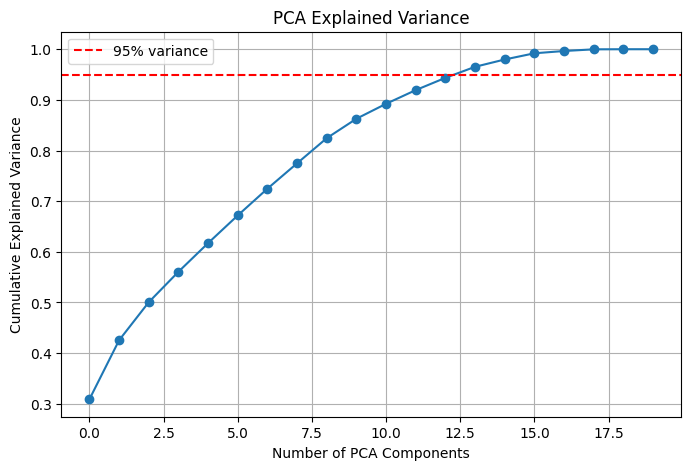

PCA Reconstruction Error

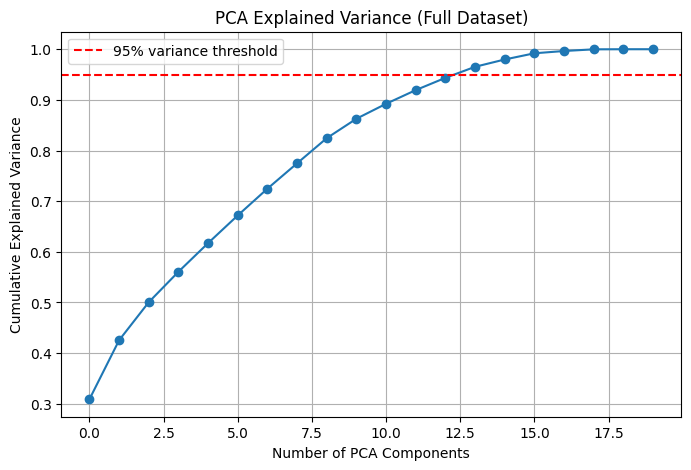

Using 14 components to reach 95% variance
PCA Reconstruction Error (MSE with 14 components): 0.032953


In [ ]:
# === PCA Full (on all data) ===
pca_full = PCA().fit(scaled)
cumulative_var = np.cumsum(pca_full.explained_variance_ratio_)

# --- Plot cumulative explained variance ---
plt.figure(figsize=(8, 5))
plt.plot(cumulative_var, marker='o')
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance (Full Dataset)')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% variance threshold')
plt.grid(True)
plt.legend()
plt.show()

# --- Select number of components for 95% variance ---
n_components = np.argmax(cumulative_var >= 0.95) + 1
print(f"Using {n_components} components to reach 95% variance")

# --- Reduce and reconstruct using selected number of PCA components ---
pca_reduced = PCA(n_components=n_components)
reduced = pca_reduced.fit_transform(scaled)
reconstructed = pca_reduced.inverse_transform(reduced)

# --- Compute reconstruction error ---
mse = mean_squared_error(scaled, reconstructed)
print(f"PCA Reconstruction Error (MSE with {n_components} components): {mse:.6f}")

UMAP Reconstruction Error (not perfect because it isn't linear)

**Can be excluded, it's just for funsies**

All other nolinear dimensionality reduction techniques: Isomap, LLE, Modified LLE (didn't work), LTSA (didn't work), Kernel PCA, Spectra Embedding, MDS

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_isomap.py:384: UserWarning: The number of connected components of the neighbors graph is 3 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/usr/local/lib/python3.11/dist-packages/scipy/sparse/_index.py:168: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])
/usr/local/lib/python3.11/dist-packages/scipy/sparse/_index.py:168: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])
/usr/local/lib/python3.11/dist-packages/scipy/sparse/_index.py:168: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


LTSA failed: Error in determining null-space with ARPACK. Error message: 'Factor is exactly singular'. Note that eigen_solver='arpack' can fail when the weight matrix is singular or otherwise ill-behaved. In that case, eigen_solver='dense' is recommended. See online documentation for more information.


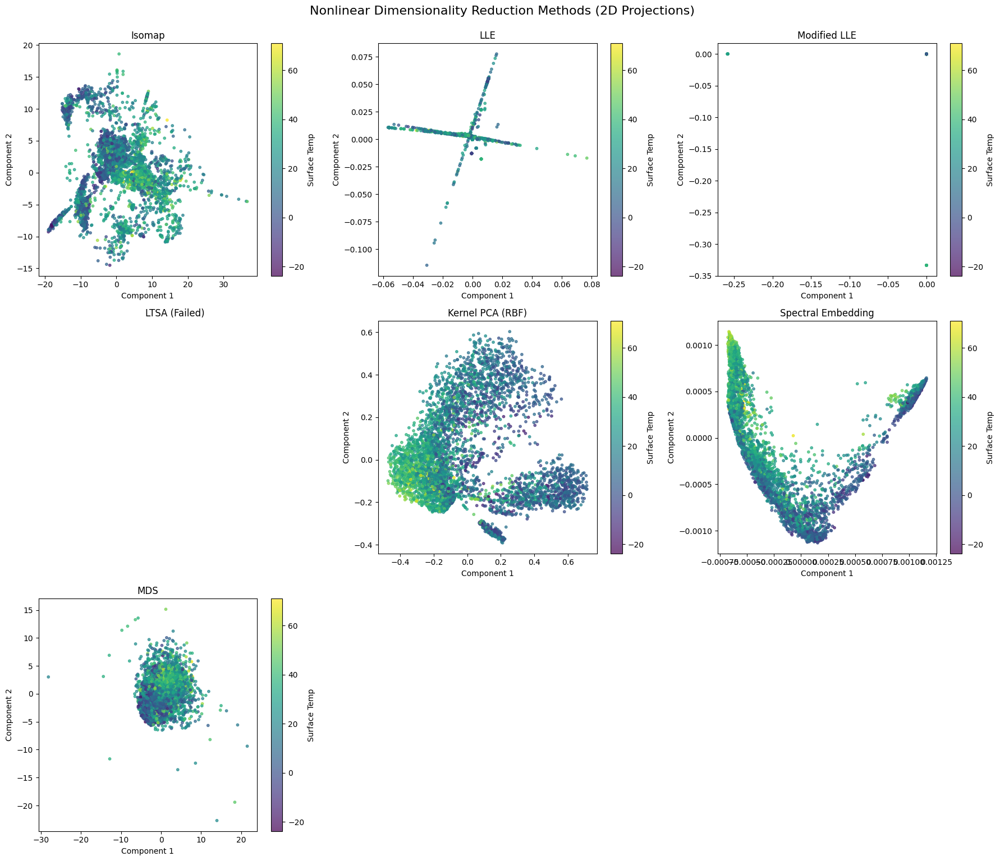

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import KernelPCA
from sklearn.manifold import Isomap, LocallyLinearEmbedding, TSNE, SpectralEmbedding, MDS
from sklearn.datasets import make_swiss_roll
from sklearn.exceptions import ConvergenceWarning
import warnings

# Silence convergence warnings for methods like LLE
warnings.simplefilter("ignore", category=ConvergenceWarning)

# Load and preprocess
df = pd.read_parquet("mv_surface_temperatures_with_date_parts.parquet")
df_numeric = df.select_dtypes(include='number').dropna(axis=1, thresh=len(df) * 0.5).fillna(0)
scaled = StandardScaler().fit_transform(df_numeric)

# Sample 5000 points
sample_size = 5000
sample_idx = np.random.choice(len(scaled), size=sample_size, replace=False)
scaled_sample = scaled[sample_idx]
df_sample = df_numeric.iloc[sample_idx]

# Color labels
labels = df_sample["sample_surface_temperature_c"].values if "sample_surface_temperature_c" in df_sample.columns else np.zeros(sample_size)

# Dimensionality reduction methods
methods = {
    "Isomap": Isomap(n_components=2),
    "LLE": LocallyLinearEmbedding(n_components=2, method='standard'),
    "Modified LLE": LocallyLinearEmbedding(n_components=2, method='modified'),
    "LTSA": LocallyLinearEmbedding(n_components=2, method='ltsa'),
    "Kernel PCA (RBF)": KernelPCA(n_components=2, kernel='rbf', gamma=0.1),
    "Spectral Embedding": SpectralEmbedding(n_components=2),
    "MDS": MDS(n_components=2, random_state=42, n_init=1, max_iter=100)
}

# Apply and collect projections
projections = {}
for name, model in methods.items():
    try:
        projections[name] = model.fit_transform(scaled_sample)
    except Exception as e:
        projections[name] = None
        print(f"{name} failed: {e}")

# Plot all projections
n_methods = len(methods)
n_cols = 3
n_rows = int(np.ceil(n_methods / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, (name, embedding) in enumerate(projections.items()):
    ax = axes[i]
    if embedding is not None:
        sc = ax.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='viridis', s=10, alpha=0.7)
        ax.set_title(name)
        ax.set_xlabel("Component 1")
        ax.set_ylabel("Component 2")
        plt.colorbar(sc, ax=ax, label="Surface Temp")
    else:
        ax.set_title(f"{name} (Failed)")
        ax.axis('off')

# Hide extra subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle("Nonlinear Dimensionality Reduction Methods (2D Projections)", fontsize=16, y=1.02)
plt.show()


3 Validation Metrics

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

n_clusters = 3  # Adjust as needed

for name, embedding in projections.items():
    if embedding is None:
        print(f"{name}: Embedding failed, skipping validation.")
        continue
    # Cluster the embedding
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(embedding)

    sil = silhouette_score(embedding, cluster_labels)
    ch = calinski_harabasz_score(embedding, cluster_labels)
    db = davies_bouldin_score(embedding, cluster_labels)

    print(f"{name}:")
    print(f"  Silhouette Score: {sil:.4f}")
    print(f"  Calinski-Harabasz Index: {ch:.4f}")
    print(f"  Davies-Bouldin Index: {db:.4f}\n")



Isomap:
  Silhouette Score: 0.4777
  Calinski-Harabasz Index: 5056.4965
  Davies-Bouldin Index: 0.7284

LLE:
  Silhouette Score: 0.8346
  Calinski-Harabasz Index: 9101.0468
  Davies-Bouldin Index: 0.1848

Modified LLE:
  Silhouette Score: 1.0000
  Calinski-Harabasz Index: 17630681571770303650719596544.0000
  Davies-Bouldin Index: 0.0000

LTSA: Embedding failed, skipping validation.
Kernel PCA (RBF):
  Silhouette Score: 0.5490
  Calinski-Harabasz Index: 7124.6816
  Davies-Bouldin Index: 0.6435

Spectral Embedding:
  Silhouette Score: 0.6563
  Calinski-Harabasz Index: 13861.0700
  Davies-Bouldin Index: 0.4740

MDS:
  Silhouette Score: 0.3880
  Calinski-Harabasz Index: 3388.3157
  Davies-Bouldin Index: 0.9444



Graph the validation scores

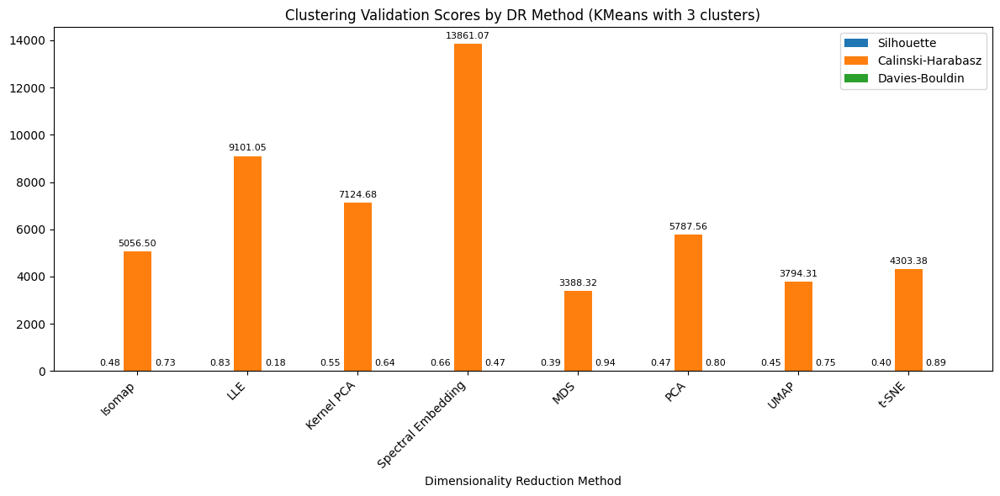

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Your nonlinear embeddings dict (skip failed ones)
nonlinear_embeddings = {
    "Isomap": projections.get("Isomap"),
    "LLE": projections.get("LLE"),
    "Kernel PCA": projections.get("Kernel PCA (RBF)"),
    "Spectral Embedding": projections.get("Spectral Embedding"),
    "MDS": projections.get("MDS"),
}

# Your linear + nonlinear embeddings from the other block
# Assuming these variables exist: X_pca, X_umap, X_tsne
# And that you have scaled_sample & labels (not used directly here since clustering)
linear_nonlinear_embeddings = {
    "PCA": X_pca,
    "UMAP": X_umap,
    "t-SNE": X_tsne,
}

# Merge dictionaries
all_embeddings = {**nonlinear_embeddings, **linear_nonlinear_embeddings}

n_clusters = 3  # clustering parameter for all

methods = []
sil_scores = []
ch_scores = []
db_scores = []

for name, embedding in all_embeddings.items():
    if embedding is None:
        print(f"{name}: Embedding failed or missing, skipping.")
        continue

    # Run KMeans to get cluster labels
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(embedding)

    # Calculate validation metrics
    sil = silhouette_score(embedding, cluster_labels)
    ch = calinski_harabasz_score(embedding, cluster_labels)
    db = davies_bouldin_score(embedding, cluster_labels)

    methods.append(name)
    sil_scores.append(sil)
    ch_scores.append(ch)
    db_scores.append(db)

# Plotting
x = np.arange(len(methods))
width = 0.25

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width, sil_scores, width, label='Silhouette')
rects2 = ax.bar(x, ch_scores, width, label='Calinski-Harabasz')
rects3 = ax.bar(x + width, db_scores, width, label='Davies-Bouldin')

ax.set_xlabel('Dimensionality Reduction Method')
ax.set_title('Clustering Validation Scores by DR Method (KMeans with 3 clusters)')
ax.set_xticks(x)
ax.set_xticklabels(methods, rotation=45, ha='right')
ax.legend()

# Add value labels on bars
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(rect.get_x() + rect.get_width()/2, height),
                    xytext=(0,3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

plt.tight_layout()
plt.show()


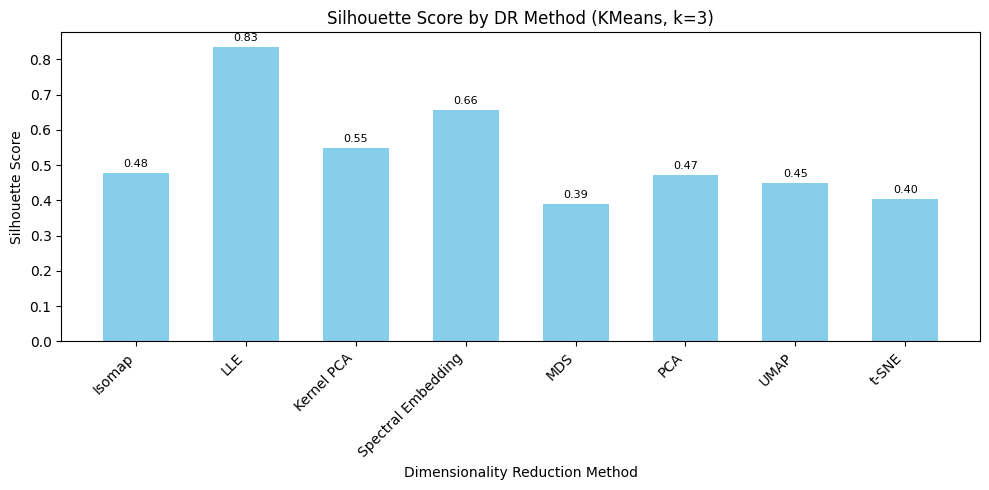

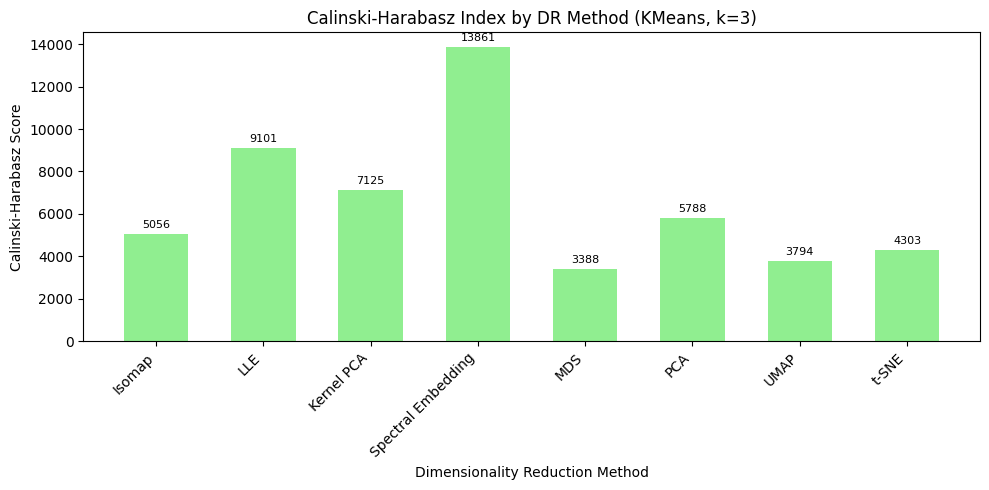

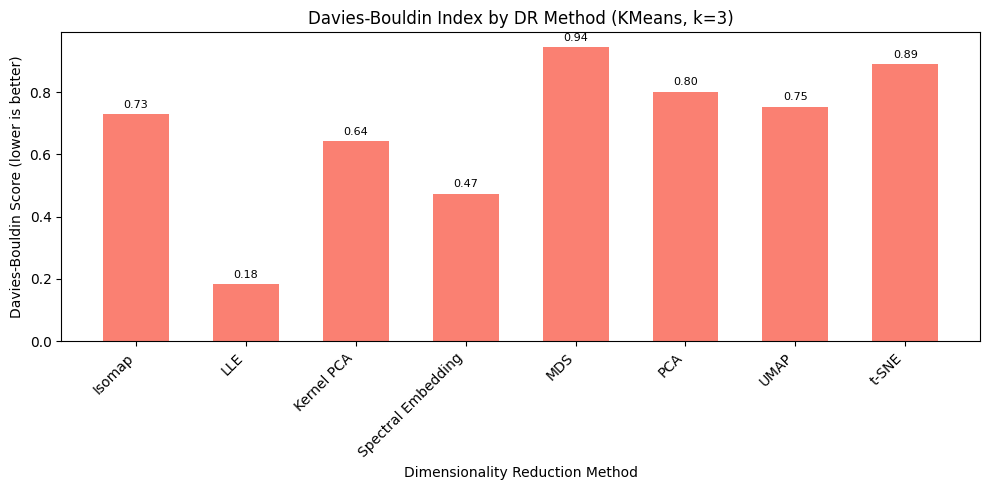

In [ ]:
# Plotting
x = np.arange(len(methods))
width = 0.6

# --- Plot 1: Silhouette ---
fig, ax1 = plt.subplots(figsize=(10, 5))
rects1 = ax1.bar(x, sil_scores, width, color='skyblue')
ax1.set_title('Silhouette Score by DR Method (KMeans, k=3)')
ax1.set_xlabel('Dimensionality Reduction Method')
ax1.set_ylabel('Silhouette Score')
ax1.set_xticks(x)
ax1.set_xticklabels(methods, rotation=45, ha='right')
for rect in rects1:
    height = rect.get_height()
    ax1.annotate(f'{height:.2f}', xy=(rect.get_x() + rect.get_width()/2, height),
                 xytext=(0, 3), textcoords='offset points',
                 ha='center', va='bottom', fontsize=8)
plt.tight_layout()
plt.show()

# --- Plot 2: Calinski-Harabasz ---
fig, ax2 = plt.subplots(figsize=(10, 5))
rects2 = ax2.bar(x, ch_scores, width, color='lightgreen')
ax2.set_title('Calinski-Harabasz Index by DR Method (KMeans, k=3)')
ax2.set_xlabel('Dimensionality Reduction Method')
ax2.set_ylabel('Calinski-Harabasz Score')
ax2.set_xticks(x)
ax2.set_xticklabels(methods, rotation=45, ha='right')
for rect in rects2:
    height = rect.get_height()
    ax2.annotate(f'{height:.0f}', xy=(rect.get_x() + rect.get_width()/2, height),
                 xytext=(0, 3), textcoords='offset points',
                 ha='center', va='bottom', fontsize=8)
plt.tight_layout()
plt.show()

# --- Plot 3: Davies-Bouldin ---
fig, ax3 = plt.subplots(figsize=(10, 5))
rects3 = ax3.bar(x, db_scores, width, color='salmon')
ax3.set_title('Davies-Bouldin Index by DR Method (KMeans, k=3)')
ax3.set_xlabel('Dimensionality Reduction Method')
ax3.set_ylabel('Davies-Bouldin Score (lower is better)')
ax3.set_xticks(x)
ax3.set_xticklabels(methods, rotation=45, ha='right')
for rect in rects3:
    height = rect.get_height()
    ax3.annotate(f'{height:.2f}', xy=(rect.get_x() + rect.get_width()/2, height),
                 xytext=(0, 3), textcoords='offset points',
                 ha='center', va='bottom', fontsize=8)
plt.tight_layout()
plt.show()


Silouette Score (measures how similar each point is to its own cluster vs other clusters): -1 to 1
Close to 1 -> Well clustered, Around 0 -> Overlapping Clusters. Negative -> Possible misassignments

Calinski-Harabasz Index measures the ratio of between cluster dispersion to within cluster dispersion. [0, infinity]. The higher the better

Davies-Bouldin Index
Range: [0, infinity], Goal lower is better -> more compact and well separated clusters
Measures average similar between clusters

Normalization to determine final ranking

In [ ]:
import numpy as np
import pandas as pd

# Example data: fill with your actual values
methods = ['Isomap', 'LLE', 'Kernel PCA', 'Spectral Embedding', 'MDS', 'PCA', 'UMAP', 't-SNE']
silhouette_scores = np.array([0.48, 0.83, 0.55, 0.66, 0.39, 0.47, 0.45, 0.4])
ch_scores = np.array([5056, 9101, 7125, 13861, 3388, 5788, 3794, 4303])
db_scores = np.array([0.73, 0.18, 0.64, 0.47, 0.94, 0.80, 0.75, 0.89])

# Normalize (higher is better)
sil_norm = (silhouette_scores - silhouette_scores.min()) / (silhouette_scores.max() - silhouette_scores.min())
ch_norm = (ch_scores - ch_scores.min()) / (ch_scores.max() - ch_scores.min())

# Normalize Davies-Bouldin (lower is better → invert)
db_norm = 1 - (db_scores - db_scores.min()) / (db_scores.max() - db_scores.min())

# Aggregate score
total_score = (sil_norm + ch_norm + db_norm) / 3

# Create DataFrame for ranking
ranking_df = pd.DataFrame({
    'Method': methods,
    'Silhouette': silhouette_scores,
    'Calinski-Harabasz': ch_scores,
    'Davies-Bouldin': db_scores,
    'Combined Score': total_score
}).sort_values(by='Combined Score', ascending=False)

print(ranking_df)


               Method  Silhouette  Calinski-Harabasz  Davies-Bouldin  \
1                 LLE        0.83               9101            0.18   
3  Spectral Embedding        0.66              13861            0.47   
2          Kernel PCA        0.55               7125            0.64   
0              Isomap        0.48               5056            0.73   
5                 PCA        0.47               5788            0.80   
6                UMAP        0.45               3794            0.75   
7               t-SNE        0.40               4303            0.89   
4                 MDS        0.39               3388            0.94   

   Combined Score  
1        0.848499  
3        0.744019  
2        0.371732  
0        0.213376  
5        0.198396  
6        0.141710  
7        0.058628  
4        0.000000  


/tmp/ipython-input-10-2463484042.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


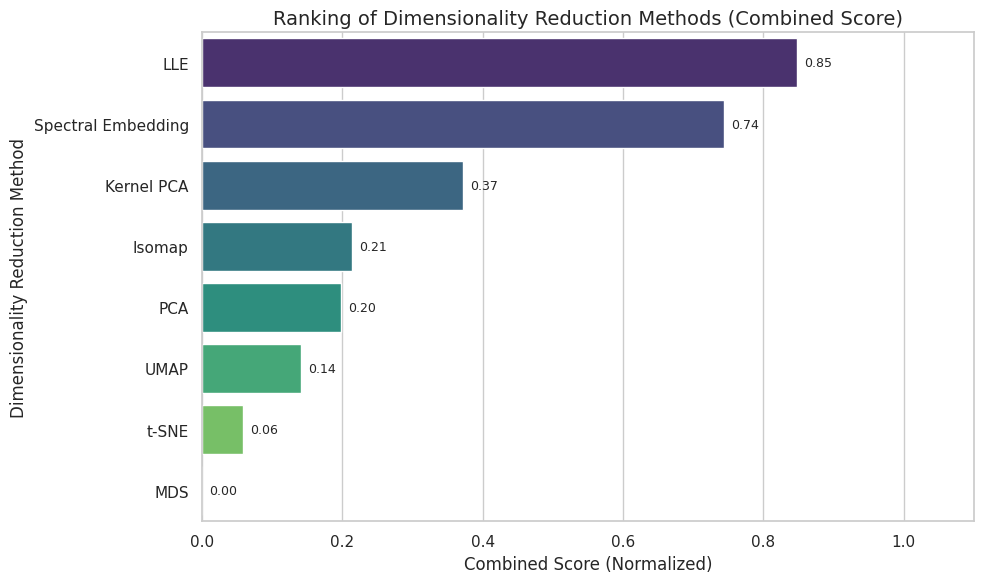

In [ ]:
import seaborn as sns

ranking_df_sorted = ranking_df.sort_values(by='Combined Score', ascending=False)

# Set Seaborn style
sns.set(style="whitegrid")

# Create the barplot
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=ranking_df_sorted,
    x='Combined Score',
    y='Method',
    palette='viridis'
)

# Add value labels
for i, (score, method) in enumerate(zip(ranking_df_sorted['Combined Score'], ranking_df_sorted['Method'])):
    ax.text(score + 0.01, i, f'{score:.2f}', va='center', ha='left', fontsize=9)

# Titles and labels
plt.title('Ranking of Dimensionality Reduction Methods (Combined Score)', fontsize=14)
plt.xlabel('Combined Score (Normalized)')
plt.ylabel('Dimensionality Reduction Method')
plt.xlim(0, 1.1)
plt.tight_layout()
plt.show()